# Team 9 PythoKnights Main 80 Questions 

In [8]:
import pandas as pd
import matplotlib.pyplot as plt 
from pywaffle import Waffle
import plotly.express as px
import numpy as np
import seaborn as sns
import scipy.stats as ss 
import altair as alt
import time
import psycopg2 
from psycopg2 import sql
from sqlalchemy import create_engine
from ydata_profiling import ProfileReport
df1=pd.read_csv("subject-info.csv")
df2=pd.read_csv("test_measure.csv")
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go

#removing duplicates
df1=df1.sort_values(by='ID')
df2=df2.sort_values(by=['ID','time'])
df1.reset_index(drop=True, inplace=True)
df2.reset_index(drop=True, inplace=True)
df1=df1.drop_duplicates(keep='first')
df2 = df2.drop_duplicates(keep='first')

In [82]:
pip install psycopg2 

   ---------------------------------------- 0.0/1.2 MB ? eta -:--:--
   ---------------------------------------- 1.2/1.2 MB 19.2 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [26]:
pip install ydata_profiling

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
   ---------------------------------------- 0.0/666.4 kB ? eta -:--:--
   --------------------------------------- 666.4/666.4 kB 13.0 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27091 sha256=ac8e5596eaef4f5b8739fb6b284e9d1fb08abe849d8bb9b3dc0b019df7cbcd21
  Stored in directory: c:\users\space\appdata\local\pip\cache\wheels\5f\d4\d7\4189b07b5902ee9f3ce0dbb14909fbe8037c39d6c63ffd49c9
Successfully built htmlmin
Note: you may need to restart the kernel to use updated packages.


In [10]:
si=df1.copy()
tm=df2.copy()
sub2=df1.copy()
test2=df2.copy()
sub=df1.copy()
test=df2.copy()

## 1. what is the average of Female athletes who participated in this graded exercise tests?

In [7]:

# Filter for female athletes (Sex == 0)
female_athletes = si[si['Sex'] == 0]

# Calculate the average age
average_age_female = female_athletes['Age'].mean()
average_age_female


29.497746144721233

## 2. Visualize age distribution of all athletes and display the median value in the chart.

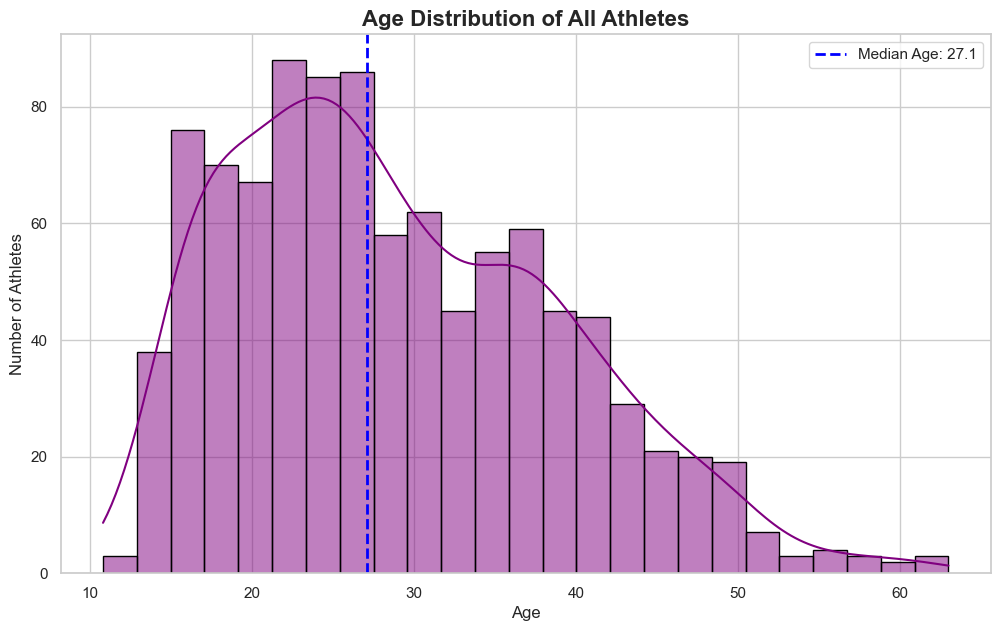

In [9]:


# Calculate the median age
median_age = si['Age'].median()

# Set the visual style
sns.set(style="whitegrid")

# Create the histogram
plt.figure(figsize=(12, 7))
sns.histplot(si['Age'], bins=25, kde=True, color='purple', edgecolor='black')

# Add a vertical line for the median age
plt.axvline(median_age, color='blue', linestyle='--', linewidth=2, label=f'Median Age: {median_age:.1f}')

# Add chart labels and title
plt.title("Age Distribution of All Athletes", fontsize=16,fontweight='bold')
plt.xlabel("Age",fontsize=12)
plt.ylabel("Number of Athletes",fontsize=12)
plt.legend()

# Show the plot
plt.show()

## 3. Find the maximum time taken for all tests and then visualize the distribution of number of tests based on the test duration in minutes. Use a line chart and display the count of tests in the chart as well.

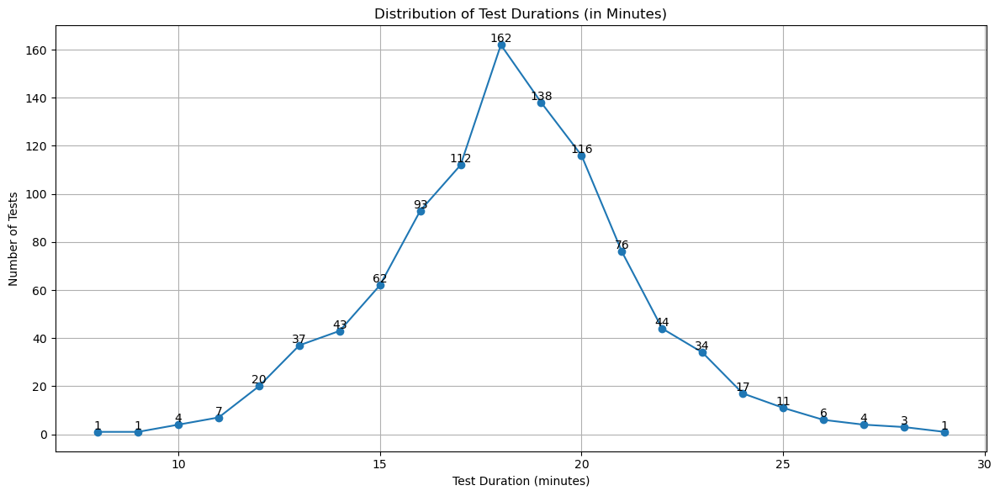

In [15]:


# Convert time to minutes per test
tm['time_min'] = tm['time'] / 60

# Get the maximum time (in minutes) for each test
test_durations = tm.groupby('ID_test')['time_min'].max()

# Count number of tests for each round
duration_counts = test_durations.round().value_counts().sort_index()

# Plot the distribution using a line chart
plt.figure(figsize=(12, 6))
plt.plot(duration_counts.index, duration_counts.values, marker='o')
for i, val in enumerate(duration_counts.values):
    plt.text(duration_counts.index[i], val, str(val), ha='center', va='bottom')
plt.title('Distribution of Test Durations (in Minutes)')
plt.xlabel('Test Duration (minutes)')
plt.ylabel('Number of Tests')
plt.grid(True)
plt.tight_layout()
plt.show()


In [17]:
tm


,time,Speed,HR,VO2,VCO2,RR,VE,ID_test,ID,time_min
0,0,5.0,63.0,478.0,360.0,27.0,13.3,2_1,2,0.000000
1,2,5.0,75.0,401.0,295.0,23.0,10.3,2_1,2,0.033333
2,4,5.0,82.0,449.0,319.0,29.0,12.2,2_1,2,0.066667
3,7,5.0,87.0,461.0,340.0,28.0,12.8,2_1,2,0.116667
4,9,5.0,92.0,574.0,417.0,28.0,14.6,2_1,2,0.150000
...,...,...,...,...,...,...,...,...,...,...
575082,926,5.0,148.0,1350.0,1699.0,35.0,65.7,857_1,857,15.433333
575083,927,5.0,147.0,1275.0,1605.0,32.0,60.1,857_1,857,15.450000
575084,929,5.0,147.0,1259.0,1566.0,29.0,57.0,857_1,857,15.483333
575085,931,5.0,147.0,1278.0,1587.0,31.0,58.5,857_1,857,15.516667


##  4. Display the consolidated list of overweight or obese people based on their BMI.

In [142]:
# Convert height from cm to meters
si['Height_m'] = si['Height'] / 100

# Calculate BMI
si['BMI'] = si['Weight'] / (si['Height_m'] ** 2)

# Filter overweight (BMI >= 25) and obese (BMI >= 30)
overweight_obese_df = si[si['BMI'] >= 25].copy()

# Display relevant columns
overweight_obese_df = overweight_obese_df[['ID', 'ID_test', 'Age', 'Sex', 'Weight', 'Height', 'BMI']]
overweight_obese_df.head()


,ID,ID_test,Age,Sex,Weight,Height,BMI
3,4,4_1,28.5,0,88.0,181.3,26.772385
4,5,5_1,23.4,0,85.0,181.4,25.831187
8,8,8_1,31.5,0,86.0,182.0,25.963048
9,9,9_1,24.5,1,72.0,167.0,25.816630
10,10,10_1,29.3,0,81.0,178.0,25.564954


##  5. Create a heatmap to visualize the correlations among any three cardiorespiratory measurements, Age, and BMI.

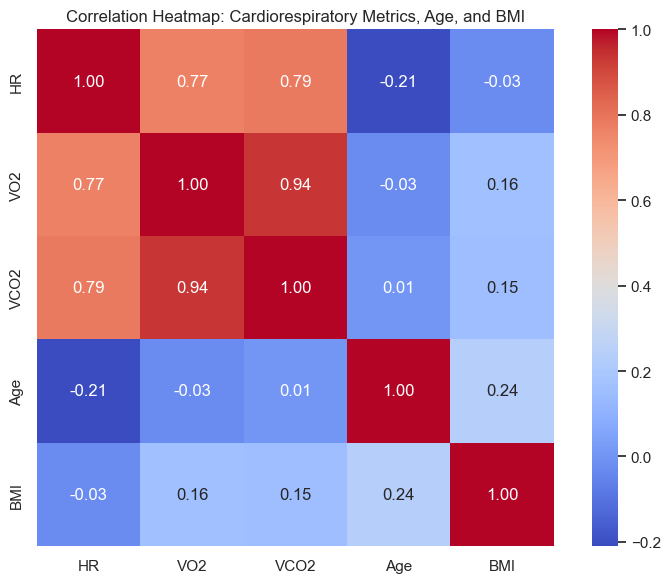

In [144]:


# Merge the BMI and Age info with the test measurement data using ID
merged_df = pd.merge(tm, si[['ID', 'Age', 'BMI']], on='ID', how='inner')

# Select three cardiorespiratory measurements and combine with Age and BMI
selected_columns = ['HR', 'VO2', 'VCO2', 'Age', 'BMI']
corr_data = merged_df[selected_columns].dropna()

# Compute correlation matrix
corr_matrix = corr_data.corr()

# Plot heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", square=True)
plt.title("Correlation Heatmap: Cardiorespiratory Metrics, Age, and BMI")
plt.tight_layout()
plt.show()


## 6. Generate subplots for second-degree trigonometric functions,using x=np.arange(0,4*np.pi,0.1) in object oriented approach. Label every π interval on X axis.
 

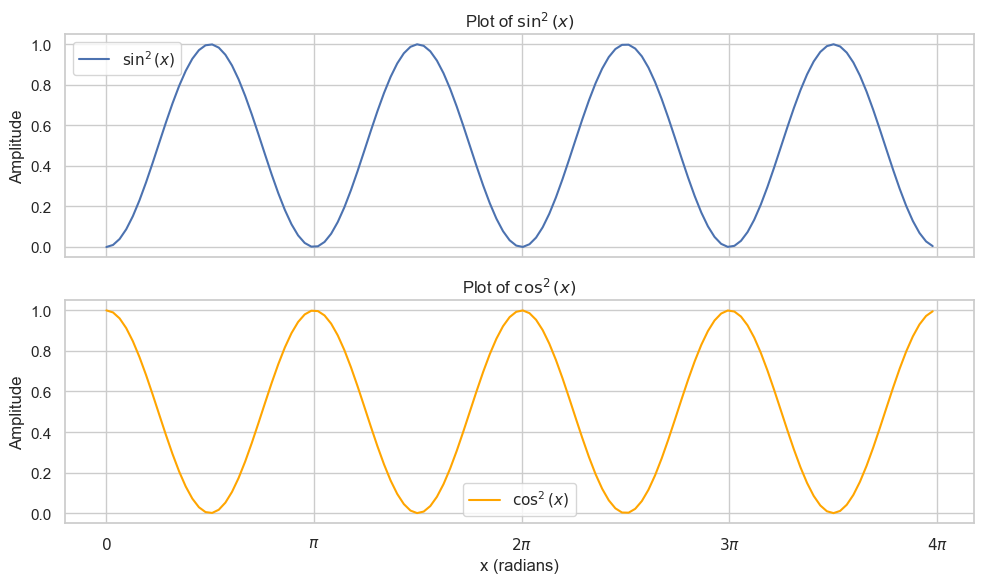

In [138]:


# Generate x values
x = np.arange(0, 4 * np.pi, 0.1)

# Calculate second-degree trigonometric functions
y1 = np.sin(x) ** 2
y2 = np.cos(x) ** 2

# Create figure and axes using object-oriented approach
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 6), sharex=True)

# Plot sin^2(x)
ax1.plot(x, y1, label=r'$\sin^2(x)$')
ax1.set_title(r'Plot of $\sin^2(x)$')
ax1.set_ylabel('Amplitude')
ax1.legend()
ax1.grid(True)

# Plot cos^2(x)
ax2.plot(x, y2, label=r'$\cos^2(x)$', color='orange')
ax2.set_title(r'Plot of $\cos^2(x)$')
ax2.set_xlabel('x (radians)')
ax2.set_ylabel('Amplitude')
ax2.legend()
ax2.grid(True)

# Customize x-axis ticks to show π intervals
pi_ticks = np.arange(0, 4 * np.pi + 0.1, np.pi)
pi_labels = [r'$0$', r'$\pi$', r'$2\pi$', r'$3\pi$', r'$4\pi$']
ax2.set_xticks(pi_ticks)
ax2.set_xticklabels(pi_labels)

# Apply the same ticks to ax1 since sharex=True
ax1.set_xticks(pi_ticks)
ax1.set_xticklabels(pi_labels)

# Adjust layout
plt.tight_layout()
plt.show()


## 7. Get a number from the user and print its multiplication table from 1 to 10.

In [47]:
# Get number input from the user
number = int(input("Enter a number to see its multiplication table: "))

# Print the multiplication table from 1 to 10
print(f"\nMultiplication Table for {number}:")
for i in range(1, 11):
    print(f"{number} x {i} = {number * i}")



Enter a number to see its multiplication table:  5



Multiplication Table for 5:
5 x 1 = 5
5 x 2 = 10
5 x 3 = 15
5 x 4 = 20
5 x 5 = 25
5 x 6 = 30
5 x 7 = 35
5 x 8 = 40
5 x 9 = 45
5 x 10 = 50


## 8. Write a function to display a correlation matrix between speed of the treadmill and any cardiorespiratory measurement  of the athelete.
(Exclude warmup period).

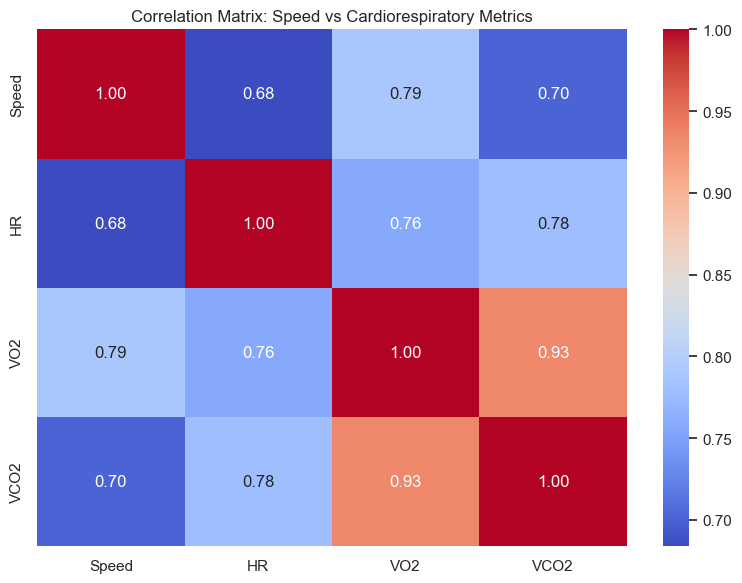

In [136]:

def display_speed_correlations(tm, measurements, warmup_speed_threshold=1.0):
    """
    Displays a correlation matrix between treadmill speed and a cardiorespiratory measurement.
    
    Parameters:
    - df: DataFrame containing the measurements
    - measurement: Column name of the cardiorespiratory measurement (e.g., 'HR', 'VO2', 'VCO2')
    - warmup_speed_threshold: Speed (in km/h) below which data is considered part of the warmup
    """
    valid_columns = ['Speed'] + [m for m in measurements if m in tm.columns]

    # Filter out warmup data
    df_filtered = tm[tm['Speed'] >= warmup_speed_threshold][valid_columns].dropna()

    # Compute correlation matrix
    corr_matrix = df_filtered.corr()

    # Plot heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
    plt.title("Correlation Matrix: Speed vs Cardiorespiratory Metrics")
    plt.tight_layout()
    plt.show()
display_speed_correlations(tm, ['HR', 'VO2', 'VCO2'])

##  9. What percentage of athletes exceeded 90% of max HR after warm up period? 


In [95]:
# Import necessary libraries
import pandas as pd

# Load the datasets
tm = pd.read_csv("test_measure.csv")     # path to get measurement file
si = pd.read_csv("subject-info.csv")     # path to get subject info file

# Merge datasets on 'ID_test' to include age info in the measurement data
merged_df = pd.merge(tm, si[['Age', 'ID_test']], on='ID_test')

# Estimate Max HR using the formula: 220 - Age
merged_df['Max_HR'] = 220 - merged_df['Age']

# Filter for post-warm-up period (e.g., Speed >= 1.0 km/h)
post_warmup_df = merged_df[merged_df['Speed'] >= 1.0].copy()

# Calculate 90% of Max HR and check if exceeded
post_warmup_df['HR_90%'] = 0.9 * post_warmup_df['Max_HR']
post_warmup_df['Exceeded_90%'] = post_warmup_df['HR'] > post_warmup_df['HR_90%']

# Find unique athletes who exceeded 90% Max HR after warm-up
athletes_exceeded = post_warmup_df[post_warmup_df['Exceeded_90%']]['ID_test'].unique()

# Total number of athletes
total_athletes = merged_df['ID_test'].nunique()

# Calculate percentage
percentage_exceeded = (len(athletes_exceeded) / total_athletes) * 100

# Display result
print(f"{percentage_exceeded:.2f}% of athletes exceeded 90% of their max HR after warm up.")






95.46% of athletes exceeded 90% of their max HR after warm up.


## 10. Which athlete spent the longest  time period in this exercise program to complete all of their cardiorespiratory measurements (including the time interval between different test cases)?

In [97]:


# Calculate duration per test case
duration_per_test = measurements_df.groupby('ID_test')['time'].agg(['min', 'max'])
duration_per_test['duration'] = duration_per_test['max'] - duration_per_test['min']

# Map ID_test to subject ID (ID), then compute total time spent by each subject (across all test cases)
id_test_to_id = measurements_df[['ID_test', 'ID']].drop_duplicates()
duration_with_id = duration_per_test.reset_index().merge(id_test_to_id, on='ID_test')

# Aggregate durations per subject ID
total_duration_per_athlete = duration_with_id.groupby('ID')['duration'].sum().reset_index()

# Identify the athlete with the maximum total duration
max_duration_athlete = total_duration_per_athlete.sort_values(by='duration', ascending=False).iloc[0]
max_duration_athlete


ID           506
duration    6017
Name: 505, dtype: int64

Athlete with ID 506 spent the longest total time in the exercise program, with a combined duration of 6017 seconds (~1 hour and 40 minutes) across all their cardiorespiratory test sessions.

## 11. Plot a 3-D graph using any set of random values chosen by you

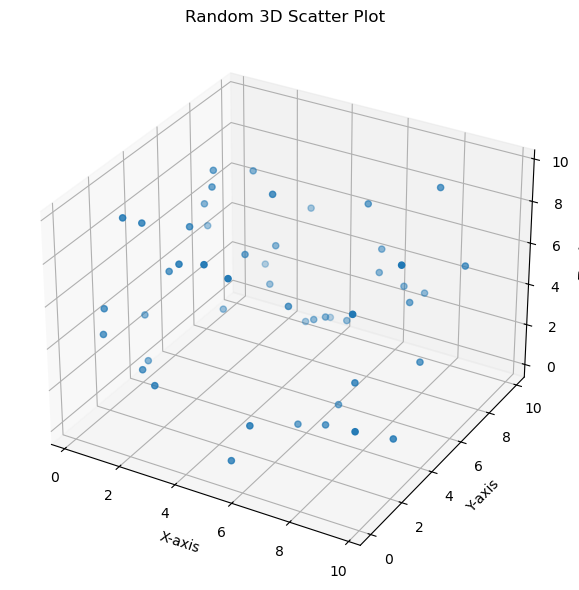

In [17]:

# Generate random data for 3D plotting
np.random.seed(42)
x = np.random.uniform(0, 10, 50)
y = np.random.uniform(0, 10, 50)
z = np.random.uniform(0, 10, 50)

# Plotting the 3D scatter plot
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(x, y, z, marker='o')
ax.set_title("Random 3D Scatter Plot")
ax.set_xlabel("X-axis")
ax.set_ylabel("Y-axis")
ax.set_zlabel("Z-axis")

plt.tight_layout()
plt.show()


3D scatter plot with randomly generated values along the X, Y, and Z axes

## 12. connect to database using PostgreSQL and get the details of participants in test 1 and age > 50


In [34]:




# Step 1: Import libraries
!pip install psycopg2-binary pandas

import psycopg2

# Step 2: Set up the database connection

conn = psycopg2.connect(
    host="localhost",        
    database="postgres", 
    user="postgres",    
    password="postgres",
    port="5432"            
)

cur=conn.cursor()






In [36]:
create_table_sql = """
CREATE TABLE IF NOT EXISTS subject_info (
    Age FLOAT,
    Weight FLOAT,
    Height FLOAT,
    Humidity FLOAT,
    Temperature FLOAT,
    Sex INT,
    ID INT,
    ID_test TEXT PRIMARY KEY
);
"""
cur.execute(create_table_sql)
conn.commit()



In [38]:
si = pd.read_csv("subject-info.csv")

# Insert each row into the PostgreSQL table
for _, row in si.iterrows():
    cur.execute("""
        INSERT INTO subject_info (Age, Weight, Height, Humidity, Temperature, Sex, ID, ID_test)
        VALUES (%s, %s, %s, %s, %s, %s, %s, %s)
        ON CONFLICT (ID_test) DO NOTHING;
    """, tuple(row))

conn.commit()

In [42]:
cur.execute("SELECT * FROM subject_info LIMIT 5;")
rows = cur.fetchall()
for row in rows:
    print(row)

(10.8, 48.8, 163.0, 39.0, 20.7, 1, 543, '543_1')
(11.8, 41.0, 150.0, 41.0, 22.3, 1, 11, '11_1')
(12.2, 46.0, 160.0, 37.0, 21.5, 0, 829, '829_1')
(13.2, 71.0, 190.0, 49.0, 23.8, 1, 284, '284_1')
(13.7, 53.8, 169.7, 40.0, 25.3, 0, 341, '341_1')


In [44]:
create_table_sql = """
CREATE TABLE IF NOT EXISTS test_measure (
    time INT,
    Speed FLOAT,
    HR FLOAT,
    VO2 FLOAT,
    VCO2 FLOAT,
    RR FLOAT,
    VE FLOAT,
    ID_test TEXT,
    ID INT
);
"""
cur.execute(create_table_sql)
conn.commit()


In [46]:


# Load the CSV file
tm = pd.read_csv("test_measure.csv")

# Insert rows
for _, row in tm.iterrows():
    cur.execute("""
        INSERT INTO test_measure (time, Speed, HR, VO2, VCO2, RR, VE, ID_test, ID)
        VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s);
    """, tuple(row))

conn.commit()
cur.execute("SELECT * FROM test_measure LIMIT 5;")
rows = cur.fetchall()
for row in rows:
    print(row)


(0, 5.0, 63.0, 478.0, 360.0, 27.0, 13.3, '2_1', 2)
(2, 5.0, 75.0, 401.0, 295.0, 23.0, 10.3, '2_1', 2)
(4, 5.0, 82.0, 449.0, 319.0, 29.0, 12.2, '2_1', 2)
(7, 5.0, 87.0, 461.0, 340.0, 28.0, 12.8, '2_1', 2)
(9, 5.0, 92.0, 574.0, 417.0, 28.0, 14.6, '2_1', 2)


In [47]:
cur.close()
conn.close()


In [66]:
# Step 1: Import required libraries
import psycopg2
import pandas as pd
# Step 2: Connect to PostgreSQL 

# Step 1: Import required libraries
import psycopg2
import pandas as pd

# Step 2: Connect to PostgreSQL 
conn = psycopg2.connect(
    host="localhost",           
    database="postgres",   
    user="postgres",      
    password="postgres",   
    port="5432"                 
)

# Step 3: SQL query to get participants from test1 and age>50
query = """
SELECT *
FROM subject_info
WHERE id_test LIKE '%_1' AND Age > 50;
"""

# Step 4: Run the query and load results into a DataFrame
df = pd.read_sql_query(query, conn)

# Step 5: Close the database connection
conn.close()

# Step 6: Display the result
df.head()


C:\Users\Vidya\AppData\Local\Temp\ipykernel_10108\4094208823.py:27: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql_query(query, conn)


,age,weight,height,humidity,temperature,sex,id,id_test
0,50.1,66.0,166.0,43.0,24.4,0,280,280_1
1,50.3,91.0,178.0,44.0,23.1,0,246,246_1
2,50.3,77.0,177.0,50.0,23.8,0,277,277_1
3,50.4,86.0,178.0,56.0,25.2,0,230,230_1
4,50.6,77.0,175.0,60.0,20.3,0,383,383_1


## 13. Make athelete ID as index to the subject_info table and arrange index in sorted order.

In [69]:
# Step 1: Set 'id' column as index,
#moves the id column to be the row index
df.set_index('id', inplace=True)

# Step 2: Sort the index
# sorts the DataFrame based on athlete ID (ascending by default)
df.sort_index(inplace=True)

# Step 3: Display the result
df.head()


,age,weight,height,humidity,temperature,sex,id_test
id,,,,,,,
230,50.4,86.0,178.0,56.0,25.2,0,230_1
242,52.4,74.0,170.0,42.0,22.6,0,242_1
245,54.0,54.0,164.0,23.7,23.8,0,245_1
246,50.3,91.0,178.0,44.0,23.1,0,246_1
277,50.3,77.0,177.0,50.0,23.8,0,277_1


## 14.Calculate RER (Respiratory Exchange Ratio) , and categorize exercise phase to warmup, moderate, peak exercise according to RER

In [76]:

# Step 2: Load your CSV file 
df = pd.read_csv("test_measure.csv")

# Step 3: Drop rows where VO2 or VCO2 is missing
df = df.dropna(subset=["VO2", "VCO2"])

# Step 4: Calculate RER = VCO2 / VO2
df["RER"] = df["VCO2"] / df["VO2"]

# Step 5: Define a function to classify exercise phase
def classify_exercise_phase(rer):
    if rer < 0.85:
        return "Warmup"
    elif 0.85 <= rer < 1.00:
        return "Moderate"
    else:
        return "Peak Exercise"

# Step 6: Apply classification to each row
df["Exercise_Phase"] = df["RER"].apply(classify_exercise_phase)

# Step 7: Display the updated DataFrame
df[["ID_test", "time", "VO2", "VCO2", "RER", "Exercise_Phase"]].head()


,ID_test,time,VO2,VCO2,RER,Exercise_Phase
0,2_1,0,478.0,360.0,0.753138,Warmup
1,2_1,2,401.0,295.0,0.735661,Warmup
2,2_1,4,449.0,319.0,0.710468,Warmup
3,2_1,7,461.0,340.0,0.737527,Warmup
4,2_1,9,574.0,417.0,0.726481,Warmup


##  15. Calculate the moving average(rolling mean) of HR for participant with ID 2 in a window size of 10 and plot a graph to show both moving average and original HR.

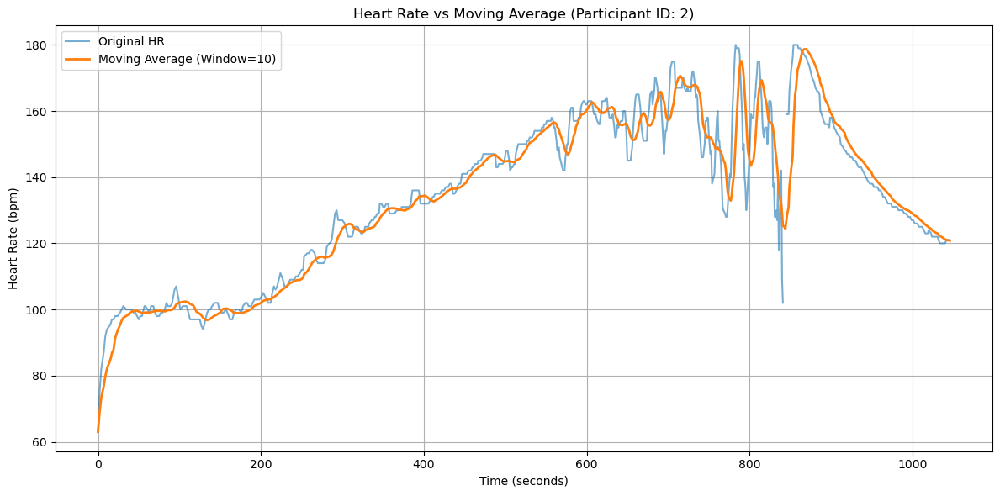

In [81]:


# Load the dataset again
measurements_df = pd.read_csv("/mnt/data/test_measure.csv")

# Filter data for participant with ID 2
participant_df = measurements_df[measurements_df["ID"] == 2].sort_values(by="time")

# Calculate moving average (rolling mean) of HR with window size 10
participant_df["HR_Moving_Avg"] = participant_df["HR"].rolling(window=10, min_periods=1).mean()

# Plot original HR and moving average
plt.figure(figsize=(12, 6))
plt.plot(participant_df["time"], participant_df["HR"], label="Original HR", alpha=0.6)
plt.plot(participant_df["time"], participant_df["HR_Moving_Avg"], label="Moving Average (Window=10)", linewidth=2)

plt.title("Heart Rate vs Moving Average (Participant ID: 2)")
plt.xlabel("Time (seconds)")
plt.ylabel("Heart Rate (bpm)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()



## 16. What was the average time each test lasted for all athletes ?

In [87]:
# Calculate the duration of each test as the difference between max and min time values
test_durations = measurements_df.groupby("ID_test")["time"].agg(['min', 'max'])
test_durations["duration"] = test_durations["max"] - test_durations["min"]

# Compute the average duration across all tests
average_test_duration = test_durations["duration"].mean()
average_test_duration


1092.0262096774193

The average time each test lasted for all athletes was approximately 1092.03 seconds, or about 18 minutes and 12 seconds

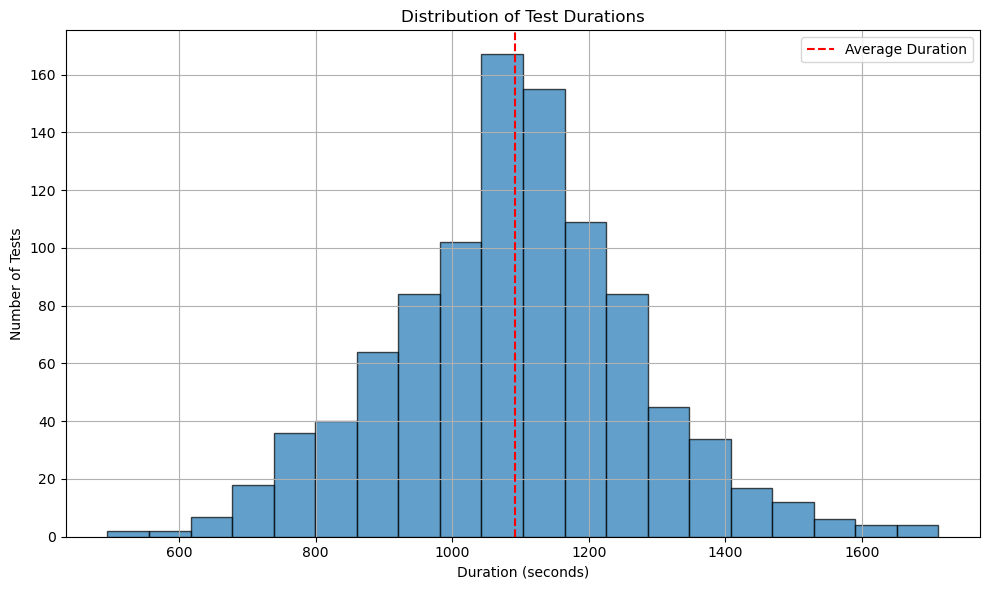

In [92]:


# Plot distribution of test durations
plt.figure(figsize=(10, 6))
plt.hist(test_durations["duration"], bins=20, edgecolor='black', alpha=0.7)
plt.axvline(test_durations["duration"].mean(), color='red', linestyle='--', label='Average Duration')

plt.title("Distribution of Test Durations")
plt.xlabel("Duration (seconds)")
plt.ylabel("Number of Tests")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


Here's the distribution of test durations across all athletes:
The red dashed line indicates the average test duration (~1092 seconds)


## 17:Display a histogram showing the distribution of athletes by their BMI values.

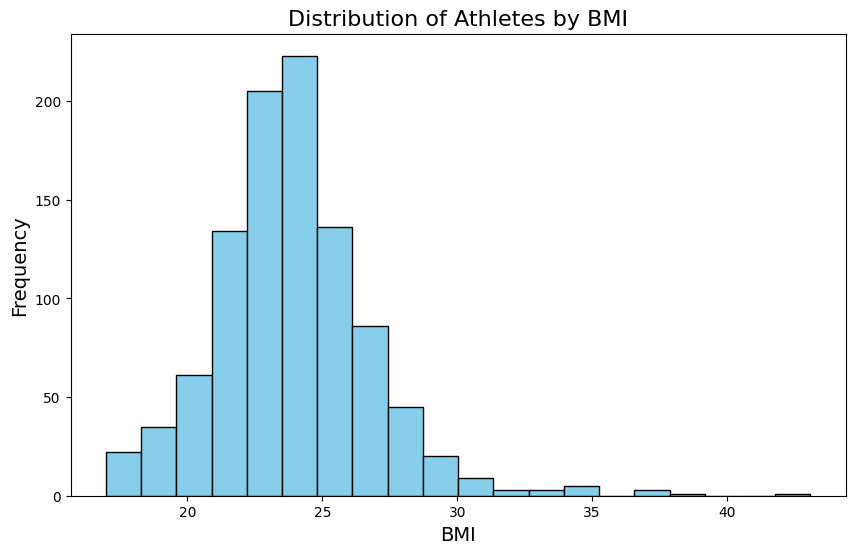

In [6]:


# Converting height from cm to m 
sub2['Height_m'] = sub2['Height'] / 100
# Calculate BMI (Body Mass Index)
sub2['BMI'] = sub2['Weight'] / (sub2['Height_m'] ** 2)

# Plot the histogram
plt.figure(figsize=(10, 6))
plt.hist(sub2['BMI'], bins=20, color='skyblue', edgecolor='black')

# Add labels and title
plt.title('Distribution of Athletes by BMI', fontsize=16)
plt.xlabel('BMI', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

# Show the plot
plt.show()

# 18.Who is the tallest participant in the dataset?What is  his/her Vo2 kg/ml?

In [20]:
# What is  his/her Vo2 kg/ml?
tallest_participant = sub2.loc[sub2['Height'].idxmax()]
print(tallest_participant)
tallest_Age =tallest_participant['Age']
tallest_Weight= tallest_participant['Weight']
tallest_Height =tallest_participant['Height']
tallest_ID_test = tallest_participant['ID_test']
merged_data =pd.merge(sub2,test2,on ='ID_test',how='left')
print(merged_data)
tallest_VO2 =merged_data.loc[merged_data['ID_test']==tallest_ID_test,'VO2'].values[0]
print(f"Tallest participants Height in cm:{tallest_Height} cm")
print(f"Tallest participant's VO2 ml/min: {tallest_VO2}")
  	
tallest_VO2_ml_kg_min = tallest_VO2/tallest_Weight
print(f"Tallest participant's VO2 ml/kg/min: {tallest_VO2_ml_kg_min}")

Age             16.9
Weight          81.0
Height         203.0
Humidity        52.0
Temperature     22.5
Sex                1
ID                94
ID_test         94_1
Name: 107, dtype: object
        Age  Weight  Height  Humidity  Temperature  Sex  ID_x ID_test  time  \
0      32.7    67.0   173.5       NaN          NaN    0     1     1_1   0.0   
1      32.7    67.0   173.5       NaN          NaN    0     1     1_1   4.0   
2      32.7    67.0   173.5       NaN          NaN    0     1     1_1  10.0   
3      32.7    67.0   173.5       NaN          NaN    0     1     1_1  14.0   
4      32.7    67.0   173.5       NaN          NaN    0     1     1_1  19.0   
...     ...     ...     ...       ...          ...  ...   ...     ...   ...   
23277  42.9    60.2   165.6      37.0         21.5    0   855   855_6   NaN   
23278  59.7    65.2   172.0      51.0         16.8    0   856   856_3   NaN   
23279  59.1    64.7   172.0      38.0         24.4    0   856   856_2   NaN   
23280  58.7    66

## 19. "What is the highest recorded heart rate ?Identify the patient with the highest recorded heart rate."

In [21]:
# The row with the highest HR
max_hr_row = test2.loc[test2['HR'].idxmax()]
max_hr = test2['HR'].max()
#print(max_hr_row)
#print(max_hr)

#Extract the ID_test of the person with the highest HR
id_test_max_hr = max_hr_row['ID_test']
highest_hr = max_hr_row['HR']


patient_info = sub2[sub2['ID_test'] == id_test_max_hr]

#Display highest recorded heart rate
print(f"Highest recorded heart rate: {highest_hr}")
print("Patient info with highest HR:")
print(patient_info)

Highest recorded heart rate: 206.0
Patient info with highest HR:
     Age  Weight  Height  Humidity  Temperature  Sex  ID ID_test
19  17.3    72.0   177.0      45.0         25.3    0  17    17_1


## 20.  What is the VO2 max(mL/kg/min) of the shortest male athlete?

In [22]:
																							
male_subjects = sub2[sub2['Sex']== 0]
#print(male_subjects)
# Find the shortest male
shortest_male = male_subjects.loc[male_subjects['Height'].idxmin()]
print(shortest_male)
shortest_id_test = shortest_male['ID_test']
weight_kg = shortest_male['Weight']
print(weight_kg)
print(shortest_id_test)

#smallest_VO2 =merged_data.loc[merged_data['ID_test']==shortest_id_test,'VO2'].values[0]
#male_athleteVO2_data = test2[test2['ID_test']== 367_1]
athlete_vo2_data = test2[test2['ID_test']== shortest_id_test]
print(athlete_vo2_data)
#Find the VO2 max (max VO2 value in mL/min)
vo2_max_mL_min = athlete_vo2_data['VO2'].max()

# Convert to VO2 max in mL/kg/min
vo2_max_mL_kg_min = vo2_max_mL_min / weight_kg

# Output result
print(f"VO₂ max of the shortest male athlete: {vo2_max_mL_kg_min:.2f} mL/kg/min")

Age             44.9
Weight          66.0
Height         159.0
Humidity        55.0
Temperature     21.5
Sex                0
ID               367
ID_test        367_1
Name: 423, dtype: object
66.0
367_1
Empty DataFrame
Columns: [time, Speed, HR, VO2, VCO2, RR, VE, ID_test, ID]
Index: []
VO₂ max of the shortest male athlete: nan mL/kg/min


## 21."Analyze the mean VO2 and VCO2 values by humidity level using a Multiseries Bar Chart.Based on your findings, how does low humidity affect respiratory and cardiovascular function during exercise (VO2 and VCO2) ?Humidity level (<30 - Low) , (30 to 60 - Normal ) ,(>60 - High)"

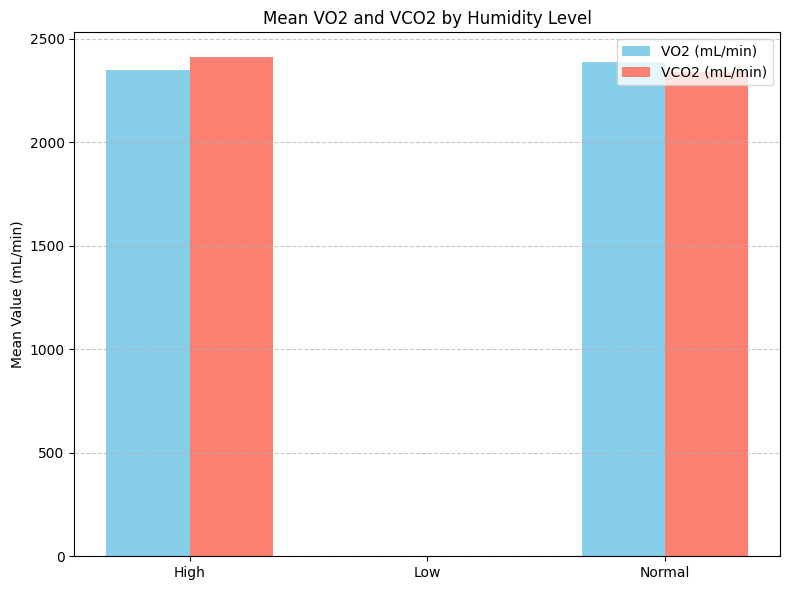

In [26]:

#Create humidity category
def categorize_humidity(h):
    if h < 30:
        return 'Low'
    elif h <= 60:
        return 'Normal'
    else:
        return 'High'

merged_data['humidity_level'] = merged_data['Humidity'].apply(categorize_humidity)
# Calculate mean VO2 and VCO2 by humidity category
summary = merged_data.groupby('humidity_level')[['VO2', 'VCO2']].mean().reset_index()
# Plot multi-series bar chart
x = summary['humidity_level']
vo2_means = summary['VO2']
vco2_means = summary['VCO2']

x_pos = range(len(x))
width = 0.35

plt.figure(figsize=(8, 6))
plt.bar([p - width/2 for p in x_pos], vo2_means, width, label='VO2 (mL/min)', color='skyblue')
plt.bar([p + width/2 for p in x_pos], vco2_means, width, label='VCO2 (mL/min)', color='salmon')
plt.xticks(x_pos, x)
plt.ylabel('Mean Value (mL/min)')
plt.title('Mean VO2 and VCO2 by Humidity Level')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


## 22. Display the average speed of each participant  in ' peak exercise' based on RER  (Following question no.14)"

In [27]:
#Calculate RER
test2['RER'] = test2['VCO2'] / test2['VO2']

#Categorize exercise phase
def categorize_rer(rer):
    if rer < 0.85:
        return 'warmup'
    elif rer <= 1.00:
        return 'moderate'
    else:
        return 'peak'

test2['exercise_phase'] = test2['RER'].apply(categorize_rer)

# Filter rows where phase is 'peak'
peak_data = test2[test2['exercise_phase'] == 'peak']

# Calculate average speed for each participant in peak phase
avg_speed_peak = peak_data.groupby('ID_test')['Speed'].mean().reset_index()
avg_speed_peak.columns = ['ID_test', 'avg_peak_speed']

# Output the results
print("Average Speed During Peak Exercise (based on RER):")
print(avg_speed_peak)

Average Speed During Peak Exercise (based on RER):
   ID_test  avg_peak_speed
0     10_1       11.355000
1     11_1        9.062712
2     12_1        7.386937
3     13_1        9.568872
4     14_1       10.212821
5     15_1       11.129964
6    15_27       13.063574
7    15_39       14.054762
8     16_1       11.706109
9     17_1       11.699685
10    18_1        8.562676
11    19_1        8.870667
12   19_51       10.292442
13     1_1        9.901773
14    20_1        8.721390
15    21_1       10.493191
16    22_1        6.922472
17    23_1       11.487008
18    24_1       12.446860
19    25_1       12.246360
20    26_1        9.928283
21    27_1        7.967857
22    28_1       11.052239
23    29_1       10.014773
24     2_1       10.850575
25    30_1       13.846753
26    31_1       13.198933
27    32_1       12.617544
28    33_1        5.556000
29     3_1       12.000597
30     4_1       10.787342
31     5_1        9.007265
32     6_1       11.949662
33     7_1        9.666270
34  

## 23. ssign one of the following 5 heart rate zones for every Athletes  and add this as a column to a new table with all unique IDs.Exclude Warm-Up Phase
### Zone 1 (recovery/easy)       <100 HR max
### Zone 2 (aerobic/base)        100-120 HR max
### Zone 3 (tempo)        120-135 HR max
### Zone 4 (lactate threshold)        135-155 HR max
### Zone 5 (anaerobic)        155+ HR max and above

In [28]:
# example: exclude first 60 seconds
df_measures = test2[test2['time'] > 60]  
# Group by athlete and find max HR (per athlete)
max_hr_per_athlete = df_measures.groupby('ID_test')['HR'].max().reset_index()
max_hr_per_athlete.rename(columns={'HR': 'Max_HR'}, inplace=True)


# Assign heart rate zones
def assign_hr_zone(hr):
    if hr < 100:
        return 'Zone 1 (recovery/easy)'
    elif 100 <= hr < 120:
        return 'Zone 2 (aerobic/base)'
    elif 120 <= hr < 135:
        return 'Zone 3 (tempo)'
    elif 135 <= hr < 155:
        return 'Zone 4 (lactate threshold)'
    else:
        return 'Zone 5 (anaerobic)'

max_hr_per_athlete['HR_Zone'] = max_hr_per_athlete['Max_HR'].apply(assign_hr_zone)

# Merge with subject_info to include only valid athletes
result = pd.merge(sub2[['ID_test', 'ID']], max_hr_per_athlete, on='ID_test', how='inner')
result = result[['ID', 'ID_test', 'Max_HR', 'HR_Zone']]
print(result.head(10))
#print(result)


   ID ID_test  Max_HR             HR_Zone
0   1     1_1   180.0  Zone 5 (anaerobic)
1   2     2_1   180.0  Zone 5 (anaerobic)
2   3     3_1   205.0  Zone 5 (anaerobic)
3   4     4_1   192.0  Zone 5 (anaerobic)
4   5     5_1   197.0  Zone 5 (anaerobic)
5   6     6_1   187.0  Zone 5 (anaerobic)
6   7   7_149   187.0  Zone 5 (anaerobic)
7   7     7_1   194.0  Zone 5 (anaerobic)
8   8     8_1   186.0  Zone 5 (anaerobic)
9   9     9_1   187.0  Zone 5 (anaerobic)


## 24. Find the athlete who has got optimal respiratory stability based on the measure of  Breathing Interval variability over time.
### Calculate Breathing Interval (BI) = 60 / RR

In [29]:
test2['BI'] = 60 / test2['RR']
#Group by athlete (ID_test), compute std deviation of BI
bi_variability = test2.groupby('ID_test')['BI'].std().reset_index()
bi_variability.columns = ['ID_test', 'BI_std']
# Find athlete with lowest BI variability
most_stable = bi_variability.loc[bi_variability['BI_std'].idxmin()]

# Output the result
print(f"Athlete with most stable breathing (lowest BI variability):")
print(most_stable)

# Merge with sub2 to get athlete data
stable_athlete_info = sub2[sub2['ID_test'] == most_stable['ID_test']]

print("Athlete Info:")
print(stable_athlete_info)

Athlete with most stable breathing (lowest BI variability):
ID_test         7_1
BI_std     0.298046
Name: 34, dtype: object
Athlete Info:
    Age  Weight  Height  Humidity  Temperature  Sex  ID ID_test
7  27.3    70.0   171.7       NaN          NaN    0   7     7_1


## 25. Generate a pie chart to show the gender-wise distribution of athletes.

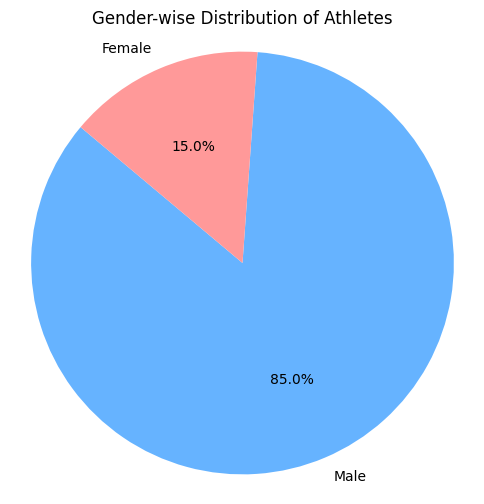

In [44]:
# Map 0 → Male, 1 → Female
sub2['Sex'] = sub2['Sex'].map({0: 'Male', 1: 'Female'})

# Count the number of athletes by gender
gender_counts = sub2['Sex'].value_counts()

# Plot the pie chart
plt.figure(figsize=(6, 6))
plt.pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%', startangle=140, colors=['#66b3ff', '#ff9999'])
plt.title('Gender-wise Distribution of Athletes')
plt.axis('equal')  # Equal aspect ratio ensures the pie is a circle
plt.show()

## 26.  Use enumeration to print ID, Sex, and BMI of each athlete.

In [45]:
# Converting height from cm to m 
sub2['Height_m'] = sub2['Height'] / 100

# Calculate BMI
sub2['BMI'] = sub2['Weight'] / (sub2['Height_m'] ** 2)

for idx, row in enumerate(sub2.itertuples(), 1):
    athlete_id = row.ID
    sex = 'Female' if row.Sex == 1 else 'Male'  # Assuming 1 is Female and 0 is Male
    bmi = row.BMI
    print(f"Athlete #{idx}: ID = {athlete_id}, Sex = {sex}, BMI = {bmi:.2f}")

Athlete #1: ID = 1, Sex = Male, BMI = 22.26
Athlete #2: ID = 2, Sex = Male, BMI = 23.23
Athlete #3: ID = 3, Sex = Male, BMI = 20.60
Athlete #4: ID = 4, Sex = Male, BMI = 26.77
Athlete #5: ID = 5, Sex = Male, BMI = 25.83
Athlete #6: ID = 6, Sex = Male, BMI = 21.77
Athlete #7: ID = 7, Sex = Male, BMI = 24.33
Athlete #8: ID = 7, Sex = Male, BMI = 23.74
Athlete #9: ID = 8, Sex = Male, BMI = 25.96
Athlete #10: ID = 9, Sex = Male, BMI = 25.82
Athlete #11: ID = 10, Sex = Male, BMI = 25.56
Athlete #12: ID = 11, Sex = Male, BMI = 18.22
Athlete #13: ID = 12, Sex = Male, BMI = 34.87
Athlete #14: ID = 13, Sex = Male, BMI = 22.60
Athlete #15: ID = 14, Sex = Male, BMI = 29.93
Athlete #16: ID = 15, Sex = Male, BMI = 23.96
Athlete #17: ID = 15, Sex = Male, BMI = 24.38
Athlete #18: ID = 15, Sex = Male, BMI = 23.71
Athlete #19: ID = 16, Sex = Male, BMI = 21.34
Athlete #20: ID = 17, Sex = Male, BMI = 22.98
Athlete #21: ID = 18, Sex = Male, BMI = 25.51
Athlete #22: ID = 19, Sex = Male, BMI = 23.04
Athlete

## 27.Create a sunburst chart to show the distribution of athletes based on Sex, BMI levels, and Age ranges.
## Categorize BMI levels

In [51]:
def categorize_bmi(bmi):
    if bmi < 18.5:
        return 'Underweight'
    elif 18.5 <= bmi < 24.9:
        return 'Normal weight'
    elif 25 <= bmi < 29.9:
        return 'Overweight'
    else:
        return 'Obesity'

sub2['BMI_Level'] = sub2['BMI'].apply(categorize_bmi)

# Categorize Age into ranges
def categorize_age(age):
    if age >= 18 and age <= 25:
        return '18-25'
    elif age >= 26 and age <= 35:
        return '26-35'
    elif age >= 36 and age <= 45:
        return '36-45'
    elif age >= 46 and age <= 60:
        return '46-60'
    else:
        return '60+'
        
sub2['Age_Range'] = sub2['Age'].apply(categorize_age) 
# Create the sunburst chart using Plotly
fig = px.sunburst(sub2, 
                  path=['Sex', 'BMI_Level', 'Age_Range'],  # Hierarchy of levels
                  title='Distribution of Athletes by Sex, BMI Levels, and Age Ranges')

# Show the chart
fig.show()

## 28. "Create a dictionary using any 5 random Athletes ID and their height. 
### Access any one height using the Athlete ID with get() function. "

In [48]:

#Randomly sample 5 athletes
sample_athletes = sub2.sample(5)

# Dictionary creation
athlete_heights = dict(zip(sample_athletes['ID'], sample_athletes['Height']))

print("Athlete Heights Dictionary:")
print(athlete_heights)

# first ID from the dictionary
any_id  = list(athlete_heights.keys())[0]
height = athlete_heights.get(any_id )

print(f"\nThe height of athlete with ID {any_id} is {height} cm.")

Athlete Heights Dictionary:
{26: 184.0, 529: 187.0, 176: 179.0, 134: 173.0, 519: 180.0}

The height of athlete with ID 26 is 184.0 cm.


## 29.Find which age range has the highest number of obese athletes.


In [52]:
#  Define a function to categorize BMI
def bmi_category(bmi):
    if bmi < 18.5:
        return 'Underweight'
    elif 18.5 <= bmi < 25:
        return 'Normal weight'
    elif 25 <= bmi < 30:
        return 'Overweight'
    else:
        return 'Obesity'

sub2['BMI_Category'] = sub2['BMI'].apply(bmi_category)

def age_range(age):
    if 18 <= age <= 25:
        return '18-25'
    elif 26 <= age <= 35:
        return '26-35'
    elif 36 <= age <= 45:
        return '36-45'
    elif 46 <= age <= 60:
        return '46-60'
    else:
        return '60+'

sub2['Age_Range'] = sub2['Age'].apply(age_range)


obese_athletes = sub2[sub2['BMI_Category'] == 'Obesity']

obese_counts = obese_athletes['Age_Range'].value_counts()

most_obese_age_range = obese_counts.idxmax()
count = obese_counts.max()

print("Age range with the highest number of obese athletes:")
print(f"{most_obese_age_range} with {count} obese athletes")


Age range with the highest number of obese athletes:
26-35 with 11 obese athletes


## 30.Create a waffle chart to show the percentage of participant in each HR zone

## (followed by question 23)"

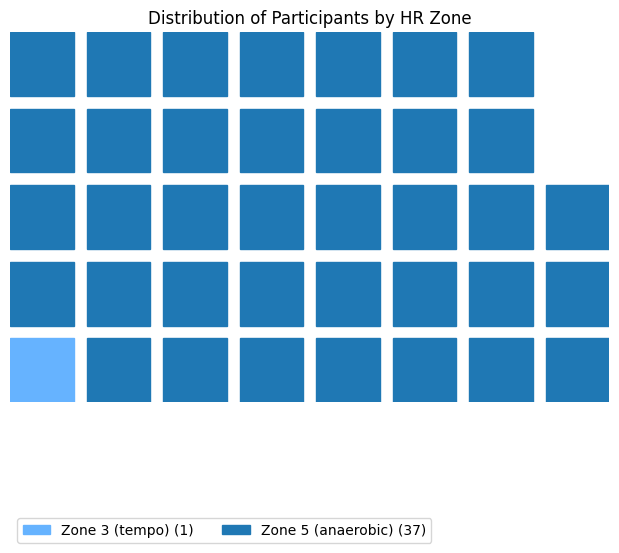

In [54]:

zone_counts = result['HR_Zone'].value_counts().sort_index()

colors = ["#66b3ff", "#1f78b4", "#b2df8a", "#33a02c", "#fb9a99"]

if len(zone_counts) < len(colors):
    colors = colors[:len(zone_counts)] 

fig = plt.figure(
    FigureClass=Waffle, 
    rows=5,  # Adjust based on how you want the grid to look
    values=zone_counts,
    title={'label': 'Distribution of Participants by HR Zone', 'loc': 'center'},
    labels=[f"{k} ({v})" for k, v in zone_counts.items()],
    legend={'loc': 'lower left', 'bbox_to_anchor': (0, -0.4), 'ncol': 2},
    figsize=(12, 6),
    colors=colors
)


plt.show()

## 30.Calculate the Tidal volume of every athlete and display it as a list.

In [55]:
merged_dataset = pd.merge(test2, sub2, on='ID_test')


merged_dataset = merged_dataset[(merged_dataset['VE'] > 0) & (merged_dataset['RR'] > 0)]

merged_dataset['TV'] = merged_dataset['VE'] / merged_dataset['RR']

tv_per_athlete = merged_dataset.groupby('ID_test')['TV'].mean().reset_index()

tv_per_athlete.columns = ['Athlete_ID', 'Average_Tidal_Volume']

print(tv_per_athlete)

   Athlete_ID  Average_Tidal_Volume
0        10_1              2.133345
1        11_1              0.733359
2        12_1              2.033378
3        13_1              1.137711
4        14_1              1.690336
5        15_1              2.701700
6       15_27              2.598643
7       15_39              2.381458
8        16_1              1.242279
9        17_1              1.618377
10       18_1              1.938194
11       19_1              1.526231
12      19_51              1.879148
13        1_1              2.027302
14       20_1              1.855541
15       21_1              1.895143
16       22_1              1.697343
17       23_1              1.670877
18       24_1              1.940391
19       25_1              2.081349
20       26_1              2.013693
21       27_1              1.777843
22       28_1              1.586147
23       29_1              1.632997
24        2_1              1.373192
25       30_1              2.067363
26       31_1              2

## 32.create a Pivot table to summarize the count of each HR Zone

In [59]:
combined_dataset = pd.merge(test2, sub2, on='ID_test')

filtered_data = combined_dataset[combined_dataset['time'] > 180].copy()

def assign_hr_zone(hr):
    if hr < 100:
        return 'Zone 1 (recovery/easy)'
    elif hr < 120:
        return 'Zone 2 (aerobic/base)'
    elif hr < 135:
        return 'Zone 3 (tempo)'
    elif hr < 155:
        return 'Zone 4 (lactate threshold)'
    else:
        return 'Zone 5 (anaerobic)'

filtered_data['HR_Zone'] = filtered_data['HR'].apply(assign_hr_zone)


zone_counts = filtered_data.groupby(['ID_test', 'HR_Zone']).size().reset_index(name='count')

most_common_zone = zone_counts.sort_values('count', ascending=False).drop_duplicates(subset='ID_test')

pivot = pd.pivot_table(
    most_common_zone,
    index='HR_Zone',
    aggfunc='size'
).reset_index(name='Athlete_Count')


print(pivot)



                      HR_Zone  Athlete_Count
0       Zone 2 (aerobic/base)              1
1  Zone 4 (lactate threshold)              3
2          Zone 5 (anaerobic)             34


In [101]:
df_subject = pd.read_csv('subject-info.csv')
df_test = pd.read_csv('test_measure.csv')

df_subject.columns = df_subject.columns.str.strip().str.lower()
df_test.columns = df_test.columns.str.strip().str.lower()

df_merge = pd.merge(df_test, df_subject, on='id', how='inner')


## 33. Connect to database using PostgreSQL and increase the temperature 2 degrees for participant with maximum humidity and display the result 

In [24]:
host = "localhost"
port = "5432"
user = "postgres"      # ✅ Replace this
password = "Test"  # ✅ Replace this
new_db = "Python_Database"

# Step 1: Create the new database (if not exists)
conn = psycopg2.connect(
dbname=new_db,
user=user,
password=password,
host=host,
port=port
    )
conn.autocommit = True
cur = conn.cursor()

cur.execute("""
    SELECT "ID", "Temperature","Humidity"
    FROM sub
	where "Temperature" is not null and "Humidity" is not null
    ORDER BY "Humidity" DESC
	LIMIT 1
""")

max_humidity_row = cur.fetchone()
participant_id = max_humidity_row[0]

# Step 3: Increase temperature by 2 degrees for that participant
cur.execute("""
    UPDATE sub
    SET "Temperature" = "Temperature" + 2
    WHERE "ID" = %s
    RETURNING "ID", "Temperature", "Humidity";
    
""", (participant_id,))

updated_row = cur.fetchone()
conn.commit()

# Step 4: Display the result
print("Updated Record:")
print(f"Athelete ID: {updated_row[0]}")
print(f"New Temperature: {updated_row[1]}")
print(f"Humidity: {updated_row[2]}")

# Close connection
cur.close()
conn.close()

Updated Record:
Athelete ID: 9
New Temperature: 24.0
Humidity: 69.0


## 34 Replace the array elements with their square values if element is an even number keep the odd number as such

In [ ]:
array = np.arange(12).reshape(3, 4)

result = np.where(array % 2 == 0, array ** 2, array)

print("assumed array:")
print(array)

print("\n Changed Array:")
print(result)

assumed array:
[[ 0  1  2  3]
 [ 4  5  6  7]
 [ 8  9 10 11]]

 Changed Array:
[[  0   1   4   3]
 [ 16   5  36   7]
 [ 64   9 100  11]]


## 35 Read 10 records from dataframe and convert into json format and print the data

In [ ]:
data = {
    'Age':[10.8, 11.8, 12.2, 13.2, 13.7, 13.8, 14, 14.1, 14.1, 14.1],
    'Weight':[48.8, 41, 46, 71, 53.8, 53.4, 46, 50, 47.2, 49.7],
    'Height':[163,150, 160,190, 169.7, 171, 160, 168.9, 160.2, 160.1],
    'Humidity':[39,41,37,49,40,42,40,42,40,40],
    'Temperature':[20.7, 22.3, 21.5, 23.8, 25.3, 24.4, 25.3, 24.2, 25.2, 25.8],
    'Sex':[1,1,0,1,0,0,0,0,0,0],
    'ID':[543, 11, 829, 284, 341, 341, 343, 330, 338, 339],
    'ID_test':['543_1','11_1','829_1','284_1','341_1','341_2','343_1','330_1','338_1','339_1']
}
df = pd.DataFrame(data)

json_data = df.head(10).to_json(orient='records', indent=4)


print(json_data)

[
    {
        "Age":10.8,
        "Weight":48.8,
        "Height":163.0,
        "Humidity":39,
        "Temperature":20.7,
        "Sex":1,
        "ID":543,
        "ID_test":"543_1"
    },
    {
        "Age":11.8,
        "Weight":41.0,
        "Height":150.0,
        "Humidity":41,
        "Temperature":22.3,
        "Sex":1,
        "ID":11,
        "ID_test":"11_1"
    },
    {
        "Age":12.2,
        "Weight":46.0,
        "Height":160.0,
        "Humidity":37,
        "Temperature":21.5,
        "Sex":0,
        "ID":829,
        "ID_test":"829_1"
    },
    {
        "Age":13.2,
        "Weight":71.0,
        "Height":190.0,
        "Humidity":49,
        "Temperature":23.8,
        "Sex":1,
        "ID":284,
        "ID_test":"284_1"
    },
    {
        "Age":13.7,
        "Weight":53.8,
        "Height":169.7,
        "Humidity":40,
        "Temperature":25.3,
        "Sex":0,
        "ID":341,
        "ID_test":"341_1"
    },
    {
        "Age":13.8,
        "Weigh

## 36 Create a barchart for HR Zone vs count and apply hatches to the bars.

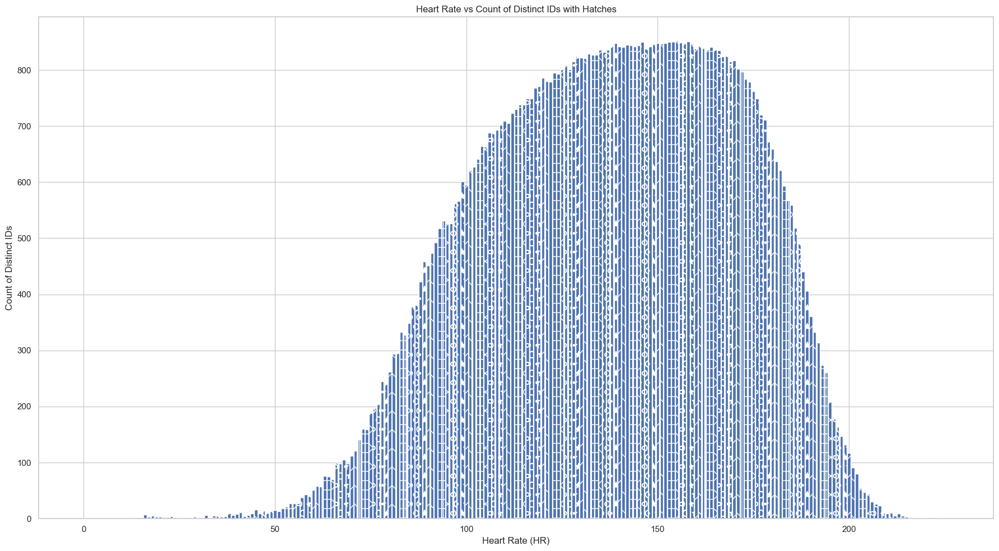

In [ ]:
# Count distinct IDs per HR
hr_id_counts = df_test.groupby('hr')['id'].nunique().sort_index()

# Create bar chart with hatching
fig, ax = plt.subplots(figsize=(18, 10))
bars = ax.bar(hr_id_counts.index, hr_id_counts.values)

# Apply hatch patterns
hatches = ['/', '\\', '|', '-', '+', 'x', 'o', 'O', '.', '*']
for i, bar in enumerate(bars):
    bar.set_hatch(hatches[i % len(hatches)])

# Labels and styling
ax.set_xlabel("Heart Rate (HR)")
ax.set_ylabel("Count of Distinct IDs")
ax.set_title("Heart Rate vs Count of Distinct IDs with Hatches")

plt.tight_layout()
plt.show()

## 37 Who is the youngest athlete and how many tests did she take part in?

In [ ]:
youngest_age = df_subject['age'].min()
youngest_athlete = df_subject[df_subject['age'] == youngest_age]
print("Youngest Athlete(s):")
print(youngest_athlete[[ 'age']])
female_df = df_subject[df_subject['sex'] == '1']  
female_tests_count = female_df.shape[0]
print(f"\nNumber of tests female athletes participated in: {female_tests_count}")

Youngest Athlete(s):
    age
0  10.8

Number of tests female athletes participated in: 0


## 38 Plot the changes in HR and VO2 over time for each ID_test. Add a trendline to compare the HR and VO2 changes.

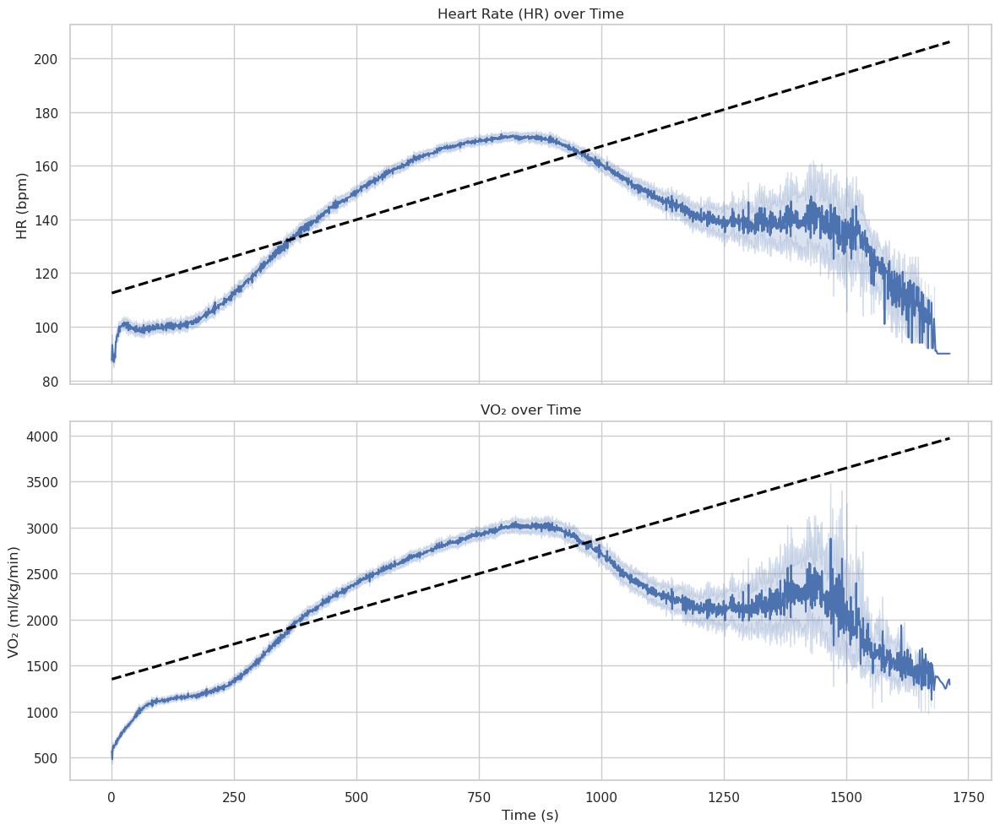

In [ ]:
sns.set(style='whitegrid')
plt.rcParams['font.family'] = 'DejaVu Sans'

# Plot HR and VO2 with trendlines per ID_test
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(12, 10), sharex=True)

# Plot HR
sns.lineplot(data=df_test, x='time', y='hr', ax=axes[0])
sns.regplot(data=df_test, x='time', y='hr', scatter=False, ax=axes[0], color='black', line_kws={"linestyle": "--"})
axes[0].set_title("Heart Rate (HR) over Time")
axes[0].set_ylabel("HR (bpm)")

# Plot VO2
sns.lineplot(data=df_test, x='time', y='vo2', ax=axes[1])
sns.regplot(data=df_test, x='time', y='vo2', scatter=False, ax=axes[1], color='black', line_kws={"linestyle": "--"})
axes[1].set_title("VO₂ over Time")
axes[1].set_ylabel("VO₂ (ml/kg/min)")
axes[1].set_xlabel("Time (s)")

plt.tight_layout()
plt.show()

## 39 Find the average HRV for individual athletes, using short-term variability analysis(RMSSD).

In [ ]:
# Calculate RR intervals in milliseconds
df_test['rr_interval'] = 60000 / df_test['hr']

# Function to calculate RMSSD for a group
def calculate_rmssd(rr_intervals):
    rr_diff = np.diff(rr_intervals)
    return np.sqrt(np.mean(rr_diff ** 2)) if len(rr_diff) > 0 else np.nan

# Group by distinct ID and calculate RMSSD
rmssd_per_id = (
    df_test
    .sort_values(['id', 'time'])  # sort by time to keep RR order correct
    .groupby('id')['rr_interval']
    .apply(calculate_rmssd)
    .reset_index(name='rmssd')
)

# To Drop NaN results if any
#rmssd_per_id = rmssd_per_id.dropna()

# Display the result
#pd.set_option('display.max_rows', 1000) # to display all the results from the given csv file
print(rmssd_per_id)

      id      rmssd
0      1        NaN
1      2        NaN
2      3   5.840448
3      4   3.504801
4      5        NaN
..   ...        ...
852  853        NaN
853  854  24.244265
854  855        NaN
855  856  37.671150
856  857   3.010206

[857 rows x 2 columns]


## 40 Identify the test that took the longest time to complete.

In [ ]:
duration_df = df_test.groupby('id_test')['time'].agg(['min', 'max']).reset_index()
duration_df['duration'] = duration_df['max'] - duration_df['min']

# Find longest test
longest_test = duration_df.loc[duration_df['duration'].idxmax()]

print("Patient ID with the longest test duration:")
print(f"ID_test: {longest_test['id_test']}")
print(f"Duration: {longest_test['duration']} seconds")

Patient ID with the longest test duration:
ID_test: 699_1
Duration: 1712 seconds


## 41 Perform an EDA of subject_info using YDATA Profiling.

In [ ]:
profile = ProfileReport(df, title="EDA Report - Subject Info", explorative=True)
profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|███████████████████████████████████████████| 9/9 [00:00<00:00, 1972.35it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 42 How does respiration rate progress based on treadmill speed for different BMI levels? 
##   Visualize this relationship and find which BMI level has the highest mean respiration rate?

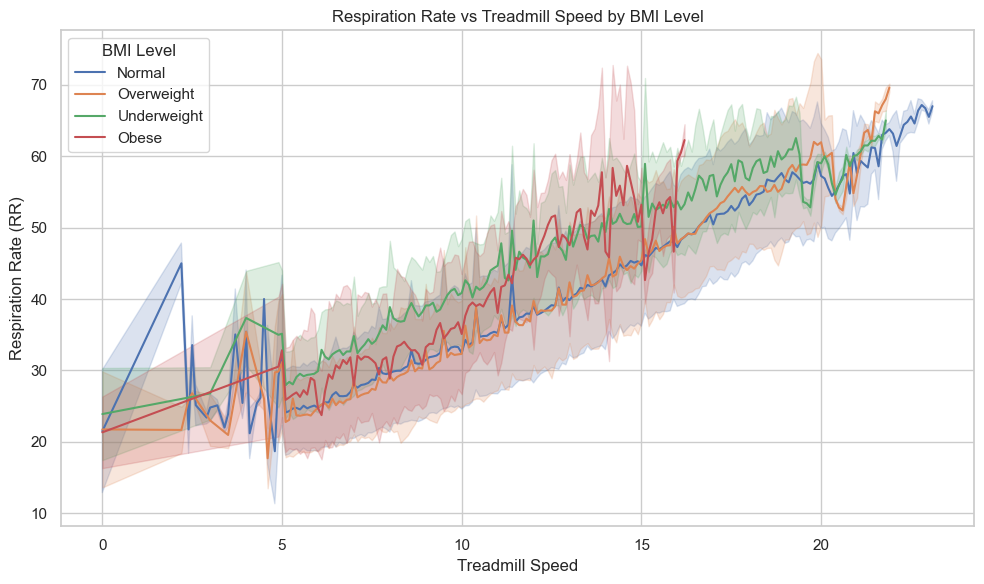

Average RR by BMI Level:
 bmi_level
Underweight    41.527322
Normal         36.947823
Overweight     35.637972
Obese          35.439317
Name: rr, dtype: float64

BMI level with highest mean RR: Underweight


In [ ]:

# Calculate BMI
df_merge['height_m'] = df_merge['height'] / 100
df_merge['bmi'] = df_merge['weight'] / (df_merge['height_m'] ** 2)

# Create BMI categories
def categorize_bmi(bmi):
    if bmi < 18.5:
        return 'Underweight'
    elif bmi < 25:
        return 'Normal'
    elif bmi < 30:
        return 'Overweight'
    else:
        return 'Obese'

df_merge['bmi_level'] = df_merge['bmi'].apply(categorize_bmi)

# Plot RR vs Speed, colored by BMI level
plt.figure(figsize=(10, 6))
sns.lineplot(data=df_merge, x='speed', y='rr', hue='bmi_level', errorbar='sd')
plt.title("Respiration Rate vs Treadmill Speed by BMI Level")
plt.xlabel("Treadmill Speed")
plt.ylabel("Respiration Rate (RR)")
plt.legend(title="BMI Level")
plt.grid(True)
plt.tight_layout()
plt.show()

# Find BMI level with highest mean RR
mean_rr_by_bmi = df_merge.groupby('bmi_level')['rr'].mean().sort_values(ascending=False)
print("Average RR by BMI Level:\n", mean_rr_by_bmi)
print("\nBMI level with highest mean RR:", mean_rr_by_bmi.idxmax())

## 43 Identify cases of possible bradycardia at rest and display number of athletes based on gender.


In [ ]:
df_merge['sex'] = df_merge['sex'].map({1: 'Male', 0: 'Female'})

# Filter to RESTING condition (assuming speed <= 1 is resting)
resting_df = df_merge[df_merge['speed'] <= 1]

# Identify potential bradycardia cases
bradycardia_df = resting_df[resting_df['hr'] < 60]

# Get unique athletes with bradycardia at rest
bradycardia_athletes = bradycardia_df[['id', 'sex']].drop_duplicates()

# Count number of athletes by gender
count_by_gender = bradycardia_athletes['sex'].value_counts()

print("Number of athletes with bradycardia at rest by gender:\n")
print(count_by_gender)

Number of athletes with bradycardia at rest by gender:

sex
Female    83
Male      11
Name: count, dtype: int64


## 44 Calculate the average heart rate corresponding to the speed of the treadmill and  plot a line graph to visualize the relationship.

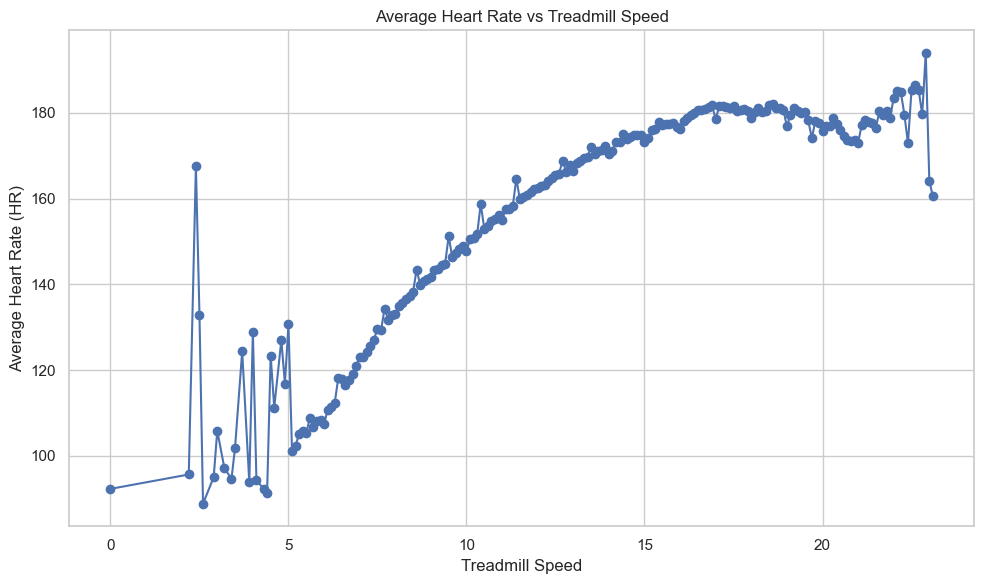

In [ ]:
# Group by speed and calculate average HR
avg_hr_by_speed = df_merge.groupby('speed')['hr'].mean().reset_index()

plt.figure(figsize=(10, 6))
plt.plot(avg_hr_by_speed['speed'], avg_hr_by_speed['hr'], marker='o', linestyle='-')
plt.title('Average Heart Rate vs Treadmill Speed')
plt.xlabel('Treadmill Speed')
plt.ylabel('Average Heart Rate (HR)')
plt.grid(True)
plt.tight_layout()
plt.show()

## 45 Analyze the trend of HR at the start of the test vs the middle and the end.What is the overall trend?

Average HR at different test stages:

stage
Start     106.290899
Middle    153.859995
End       163.839579
Name: hr, dtype: float64


C:\Users\rajar\AppData\Local\Temp\ipykernel_37788\2461920917.py:18: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  avg_hr_by_stage = df_labeled.groupby('stage')['hr'].mean()


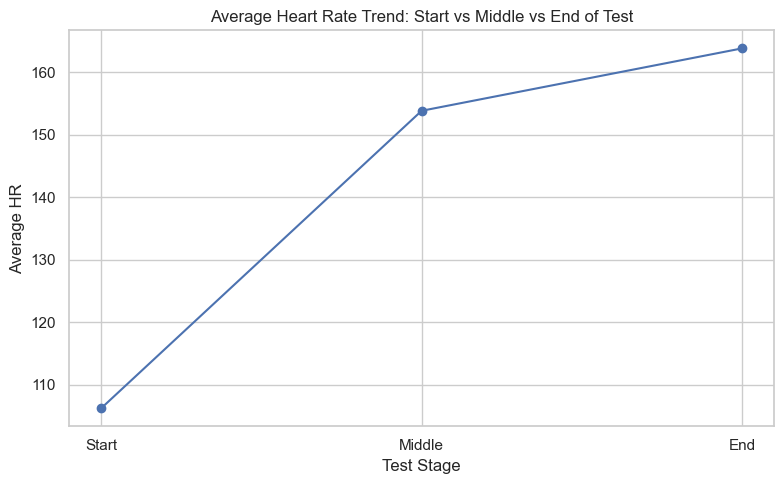

In [111]:
# Function to label each time point
def label_test_stage(df):
    # Sort by time for each test
    df = df.sort_values(by='time')
    total_time = df['time'].max()
    df['stage'] = pd.cut(
        df['time'],
        bins=[-1, total_time * 0.33, total_time * 0.66, total_time + 1],
        labels=['Start', 'Middle', 'End']
    )
    return df

# Apply the stage labeling by each test
#df_labeled = df_test.groupby('id_test').apply(label_test_stage).reset_index(drop=True)
df_labeled = df_test.groupby('id_test').apply(label_test_stage, include_groups=False).reset_index(drop=True)

# Calculate average HR for each stage
avg_hr_by_stage = df_labeled.groupby('stage')['hr'].mean()

print("Average HR at different test stages:\n")
print(avg_hr_by_stage)

avg_hr_by_stage = df_labeled.groupby('stage', observed=True)['hr'].mean()

plt.figure(figsize=(8, 5))
plt.plot(avg_hr_by_stage.index, avg_hr_by_stage.values, marker='o')
plt.title('Average Heart Rate Trend: Start vs Middle vs End of Test')
plt.xlabel('Test Stage')
plt.ylabel('Average HR')
plt.grid(True)
plt.tight_layout()
plt.show()

## 46 Find the oldest athlete in the dataset and determine the number of breaths recorded for the oldest athlete during the test.

In [ ]:
oldest_age = df_subject['age'].max()
oldest_athlete = df_subject[df_subject['age'] == oldest_age]

print("Oldest athlete info:\n", oldest_athlete[['id', 'age']])

oldest_id = oldest_athlete.iloc[0]['id']
df_oldest = df_test[df_test['id'] == oldest_id]
num_breaths = df_oldest['rr'].dropna().count()

print(f"\nNumber of breaths (RR records) recorded for athlete ID {oldest_id}: {num_breaths}")

Oldest athlete info:
       id   age
991  296  63.0

Number of breaths (RR records) recorded for athlete ID 296: 345


## 47 Assuming age is given for the current year(2025) , list the participants born on leap year

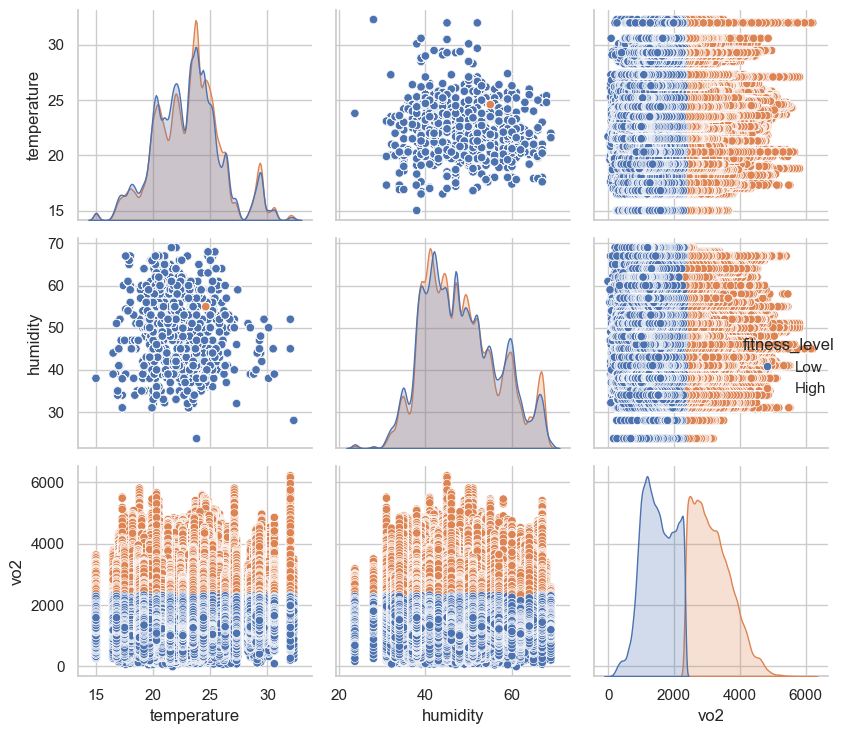

In [ ]:
median_vo2max = df_merge['vo2'].median()

# Fitness level based on VO2 max
df_merge['fitness_level'] = df_merge['vo2'].apply(lambda x: 'High' if x >= median_vo2max else 'Low')

# Create a pairplot to visualize relationships (only using relevant columns)
sns.pairplot(df_merge[['temperature', 'humidity', 'vo2', 'fitness_level']], hue='fitness_level')

# Display the plot
plt.tight_layout()
plt.show()

## 48. Use a pairplot to analyze the relationship between temperature, humidity, and  VO2 max (ml/kg/min) across different fitness levels

#### Hint :Classify "Fitness Level" as "Low" if VO2 max (ml/kg/min) is below the median, otherwise classify as "High

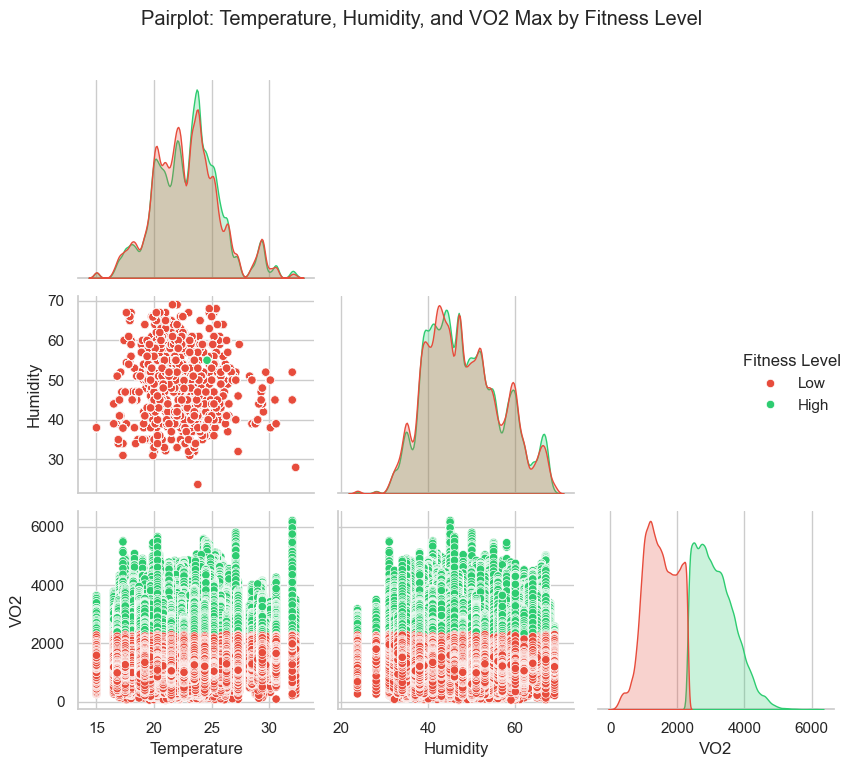

In [191]:

# Step 1: Drop rows with missing VO2, Temperature, or Humidity — and make a copy
clean_merged = merged_tab.dropna(subset=["VO2", "Temperature", "Humidity"]).copy()

# Step 2: Classify Fitness Level based on VO2 max median
median_vo2 = clean_merged["VO2"].median()
clean_merged["Fitness Level"] = clean_merged["VO2"].apply(
    lambda x: "Low" if x < median_vo2 else "High"
)

# Step 3: Create a pairplot
sns.pairplot(
    clean_merged,
    vars=["Temperature", "Humidity", "VO2"],
    hue="Fitness Level",
    palette={"Low": "#e74c3c", "High": "#2ecc71"},
    diag_kind="kde",
    corner=True
)

plt.suptitle("Pairplot: Temperature, Humidity, and VO2 Max by Fitness Level", y=1.02)
plt.tight_layout()
plt.show()

## 49.Identify the test name that had the shortest time duration.

In [37]:
# Find total duration for each test
test_durations = test.groupby('ID_test')['time'].max()

 #this helps to get the index value that has a minimum value in series
min_test_id = test_durations.idxmin()
# shortest duration and its respective ID
min_duration = test_durations.min()

print(f"Shortest test ID: {min_test_id}")
print(f"Duration: {min_duration} seconds")

Shortest test ID: 564_1
Duration: 495 seconds


## 50.What is the percentage difference in mean Carbon dioxide production between male and female athletes?

In [14]:
#merge sub and test on the ID column
merged_tab = pd.merge(test, sub, on=['ID','ID_test'], how='inner')

#Drop rows with missing VCO2 or Sex
merged = merged_tab.dropna(subset=['VCO2', 'Sex'])

#Find mean Carbondioxide of male and female
mean_C = merged.groupby('Sex')['VCO2'].mean()

vco2_female = mean_C[1]  # Sex = 1 → Female
vco2_male = mean_C[0]    # Sex = 0 → Male
print(f"Mean VCO2 (Male): {vco2_male:.2f} mL/min")
print(f"Mean VCO2 (Female): {vco2_female:.2f} mL/min")
print(f'Percentage Difference:{abs(vco2_male - vco2_female) / ((vco2_male + vco2_female) / 2) * 100:.2f} %')

Mean VCO2 (Male): 2487.68 mL/min
Mean VCO2 (Female): 1724.67 mL/min
Percentage Difference:36.23 %


## 51.Calculate the Fitness Index, generate a bar chart of Fitness Index categories, and export it as SVG file.

### Fitness Index= VO₂ (mL/min) / HR (beats/min)

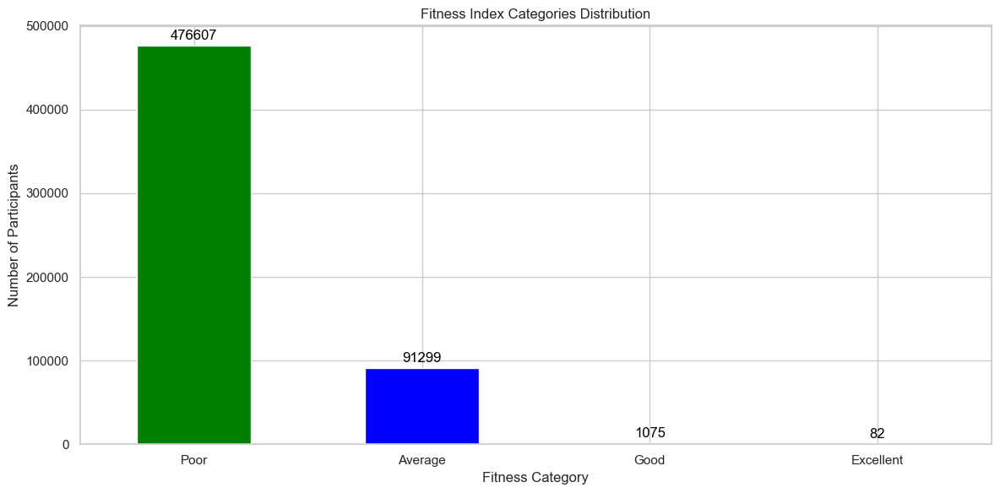

In [44]:
#drop where VO2 and HR is null
merged=merged_tab.copy()
merged=merged.dropna(subset=['VO2' , 'HR'])
#calculate fitness index column
merged.loc[:,'Fitness_index']= merged['VO2']/merged['HR']

#define a function to categorize fitness index as >40=Excellent >30=Good >20 = average <20 poor
def fitness_categ(fitness_index):
    if fitness_index>40:
        return "Excellent"
    elif fitness_index>30:
        return "Good"
    elif fitness_index>20:
        return "Average"
    else:
        return "Poor"

#Apply the above function to Fitness_index column of merged dataset
merged.loc[:,"Fitness_category"]=merged['Fitness_index'].apply(fitness_categ)

# Count the number of participants in each fitness category
category_counts = merged['Fitness_category'].value_counts()
#print(category_counts)

# Plot the bar chart of fitness categories
plt.figure(figsize=(12, 6))
ax=category_counts.plot(kind='bar', color=['green', 'blue', 'orange', 'red'])

# Add counts over the bars
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                xytext=(0, 5),  # Offset the label slightly above the bar
               textcoords='offset points',
                ha='center', 
                #va='bottom', 
                fontsize=12, color='black')
plt.title('Fitness Index Categories Distribution')
plt.xlabel('Fitness Category')
plt.ylabel('Number of Participants')
plt.xticks(rotation=0)
plt.tight_layout()

# Save the plot as an SVG file
plt.savefig('fitness_index_categories.svg', format='svg')

# Show the plot
plt.show()

## 52.arr=np.array([
##    [3, 5, 7, 9],   
##    [2, 0, 8, 10],  
##    [1, 4, 8, 12],  
##   [5, 9, 14, 15]  
##                 ] )
## Transpose this numpy matrix. and calculate sum of each row after transposing. Find the row with highest sum(after transposing)

In [47]:
#transpose an array
arr=np.array([
    [3, 5, 7, 9],   
    [2, 0, 8, 10],  
    [1, 4, 8, 12],  
    [5, 9, 14, 15]  
] )
Transpose_array= arr.T
print(f"Transposed array:\n{Transpose_array}")

# Calculating the sum of each row
row_sums = Transpose_array.sum(axis=1)

# This returns the index of the row with the highest sum
row_max_sum=row_sums.argmax()
print(f"Row with index value {row_max_sum} has highest sum")

Transposed array:
[[ 3  2  1  5]
 [ 5  0  4  9]
 [ 7  8  8 14]
 [ 9 10 12 15]]
Row with index value 3 has highest sum


## 53.Display participant details with highest average cardiorespiratory fitness in terms of VO2 max.

In [50]:
# Calculate the average VO2max per participant
average_vo2max = merged.groupby('ID')['VO2'].mean()

# Find the ID with the highest average VO2
max_VO2_id = average_vo2max.idxmax()

#Function to name the Gender
def gender(sex):
    if sex==0:
        return "F"
    else:
        return "M"

#Create Gender colum in merged table
merged_tab.loc[:,'Gender']=merged['Sex'].apply(gender)

# Get the row with the participant details for the highest average VO2max, selecting only specific columns
participant_details = merged_tab[merged_tab['ID'] == max_VO2_id][['ID', 'Age', 'Height', 'Weight', 'Gender']].iloc[0]

print(participant_details)

ID          409
Age        23.6
Height    190.0
Weight     86.0
Gender        F
Name: 273248, dtype: object


## 54.calculate the heart rate reserve and show the distribution as density plot 
Heart Rate reserve(HRR)=HR(max)-HR(rest).
HR(max)=220 approx.
HR(rest)= You can define it as the minimum heart rate observed during the test per participant/test.

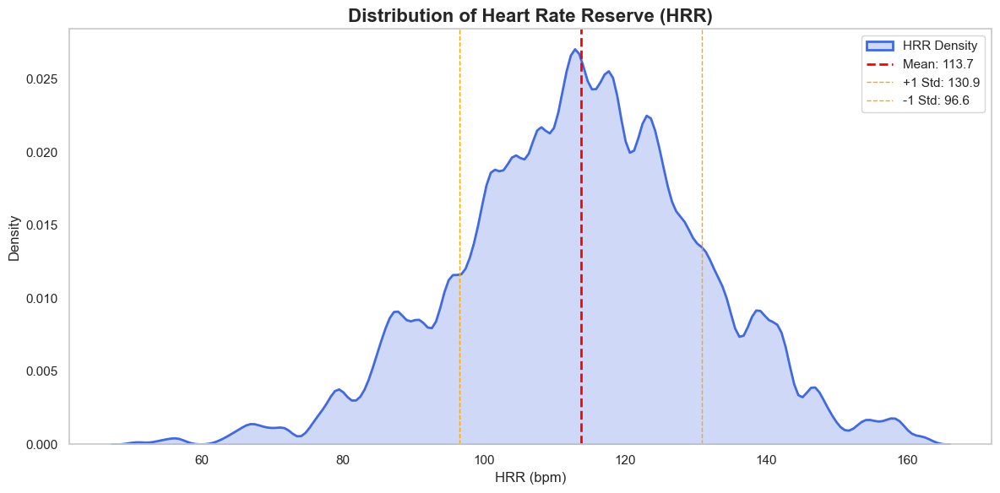

In [53]:
merged_tab = pd.merge(test, sub, on=['ID','ID_test'], how='inner')

merged_tab['HR_max'] = 220 - merged_tab['Age']

# Step 2: Compute HR_rest (minimum HR per test)
hr_rest_per_test = merged_tab.groupby('ID_test')['HR'].min().reset_index()

#rename HR to HR_rest
hr_rest_per_test.rename(columns={'HR': 'HR_rest'}, inplace=True)

# Step 3: Merge HR_rest back into merged_tab
merged_tab = pd.merge(merged_tab, hr_rest_per_test, on='ID_test', how='left')
merged_tab['HRR'] = merged_tab['HR_max'] - merged_tab['HR_rest']

#Density Plot
hrr_data = merged_tab['HRR'].dropna()

# Calculate mean and std
hrr_mean = hrr_data.mean()
hrr_std = hrr_data.std()

# Plot
plt.figure(figsize=(12, 6))
sns.kdeplot(hrr_data, fill=True, color='royalblue', linewidth=2, label='HRR Density')

# Add mean and ±1 std lines
plt.axvline(hrr_mean, color='red', linestyle='--', linewidth=2, label=f'Mean: {hrr_mean:.1f}')
plt.axvline(hrr_mean + hrr_std, color='orange', linestyle='--', linewidth=1, label=f'+1 Std: {hrr_mean + hrr_std:.1f}')
plt.axvline(hrr_mean - hrr_std, color='orange', linestyle='--', linewidth=1, label=f'-1 Std: {hrr_mean - hrr_std:.1f}')

# Labels and title
plt.title('Distribution of Heart Rate Reserve (HRR)', fontsize=16, fontweight='bold')
plt.xlabel('HRR (bpm)', fontsize=12)
plt.ylabel('Density', fontsize=12)

# Style
plt.grid(visible=False)
plt.legend()
plt.tight_layout()
plt.show()

## 55.Create a boxplot comparing heart rates between males and females, showing hue as speed category.

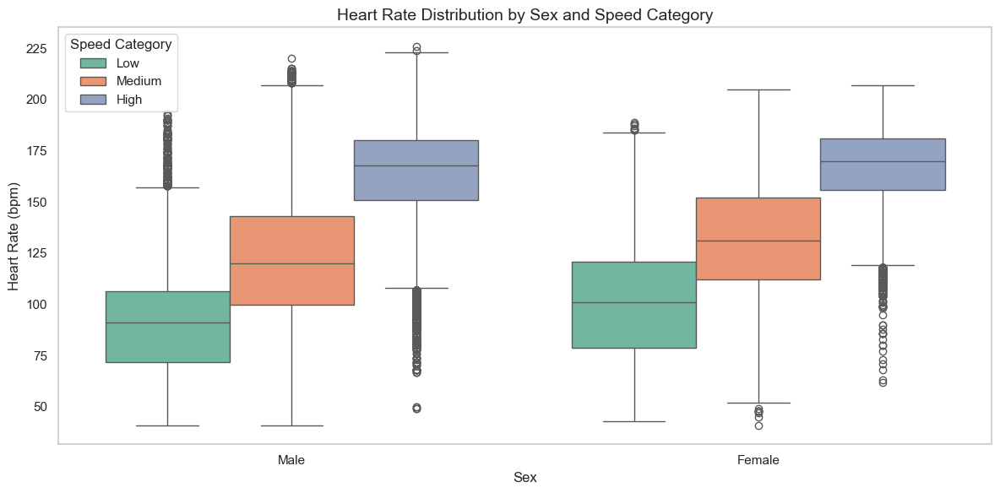

In [56]:
# Define func for Speed Categories
def speed_category(speed):
    if speed < 4:
        return 'Low'
    elif speed < 8:
        return 'Medium'
    else:
        return 'High'

merged_tab['Speed_cat'] = merged_tab['Speed'].apply(speed_category)

plt.figure(figsize=(12, 6))
sns.boxplot(data=merged_tab, x='Sex', y='HR', hue='Speed_cat', palette='Set2')

#formatting
plt.xticks([0, 1], ['Male', 'Female'])  # 0 = Male, 1 = Female
plt.title('Heart Rate Distribution by Sex and Speed Category', fontsize=14)
plt.xlabel('Sex')
plt.ylabel('Heart Rate (bpm)')
plt.legend(title='Speed Category')
plt.grid(False)
plt.tight_layout()
plt.show()

## 56.Choose any feature that follows a Gaussian distribution, convert it into a standard normal distribution, and visualize the results?

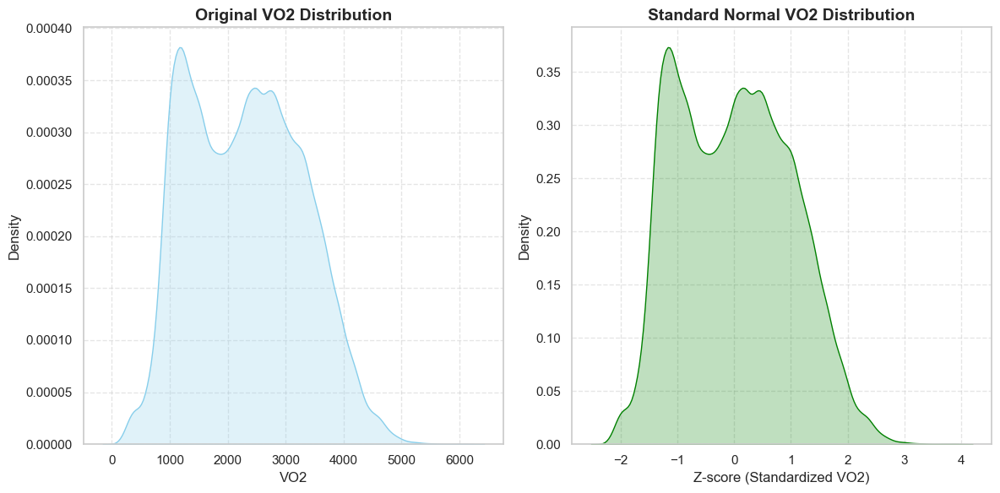

In [59]:
# 1. Drop missing values from the selected feature
vo2_data = merged_tab['VO2'].dropna()

# 2. Convert to standard normal using z-score
vo2_standardized = ss.zscore(vo2_data)

# 3. Plot original vs standardized
plt.figure(figsize=(12, 6))

# Original distribution
plt.subplot(1, 2, 1)
sns.kdeplot(vo2_data, fill=True, color='skyblue')
plt.title('Original VO2 Distribution', fontsize=14, fontweight='bold')
plt.xlabel('VO2')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.5)

# Standardized normaldistribution
plt.subplot(1, 2, 2)
sns.kdeplot(vo2_standardized, fill=True, color='green')
plt.title('Standard Normal VO2 Distribution', fontsize=14, fontweight='bold')
plt.xlabel('Z-score (Standardized VO2)')
plt.ylabel('Density')
plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

## 57. Identify the participant who has taken maximum number of Graded Exercise test and justify.

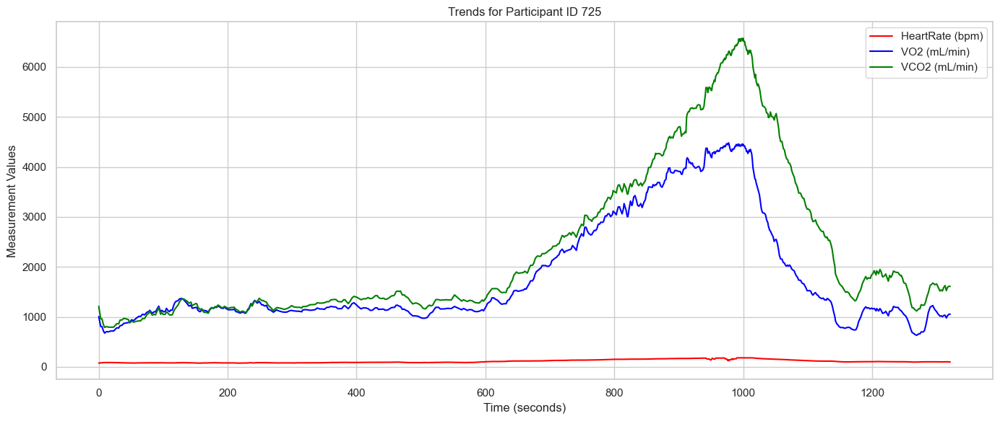

In [62]:
participant_725 = test[test['ID'] == 725]

plt.figure(figsize=(14, 6))

# Plot Heart Rate
plt.plot(participant_725['time'], participant_725['HR'], label='HeartRate (bpm)', color='red')

# Plot VO2
plt.plot(participant_725['time'], participant_725['VO2'], label='VO2 (mL/min)', color='blue')

# Plot Speed
plt.plot(participant_725['time'], participant_725['VCO2'], label='VCO2 (mL/min)', color='green')

#formatting chart
plt.title('Trends for Participant ID 725')
plt.xlabel('Time (seconds)')
plt.ylabel('Measurement Values')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

## 58.For participant ID 725 show trend of  any three variables against time in a single canva ?

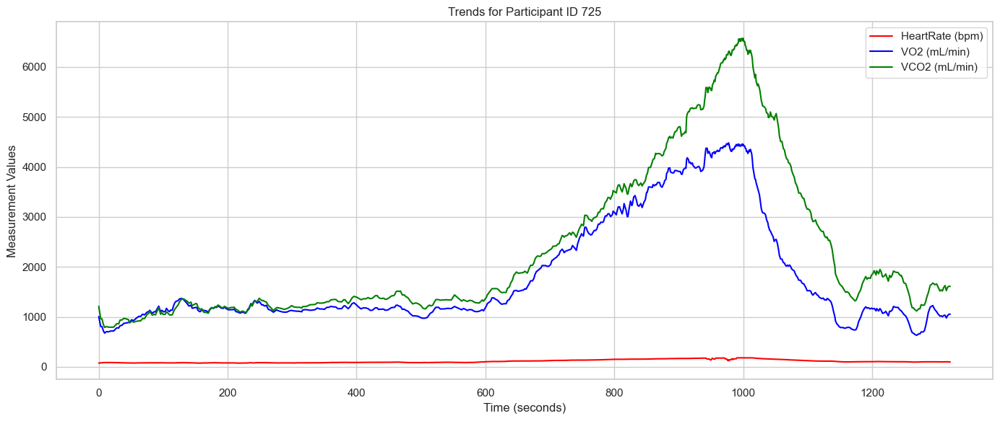

In [120]:
participant_725 = test[test['ID'] == 725]

plt.figure(figsize=(14, 6))

# Plot Heart Rate
plt.plot(participant_725['time'], participant_725['HR'], label='HeartRate (bpm)', color='red')

# Plot VO2
plt.plot(participant_725['time'], participant_725['VO2'], label='VO2 (mL/min)', color='blue')

# Plot Speed
plt.plot(participant_725['time'], participant_725['VCO2'], label='VCO2 (mL/min)', color='green')

#formatting chart
plt.title('Trends for Participant ID 725')
plt.xlabel('Time (seconds)')
plt.ylabel('Measurement Values')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


## 59.Create a scatter plot with a regression line using Altair, take a random sample data with features 'x' and 'y'.

In [65]:
pip install altair pandas numpy

Note: you may need to restart the kernel to use updated packages.


In [116]:
# Generate sample data
np.random.seed(52)
x = np.random.rand(200) * 20
y = 2.5 * x + np.random.normal(0, 10, size=200)

df = pd.DataFrame({'x': x, 'y': y})

# Create scatter plot with regression line
scatter = alt.Chart(df).mark_point(color='steelblue').encode(
    x='x',
    y='y'
).properties(
    title='Scatter Plot with Regression Line',
    width=600,
    height=400
)

regression = scatter.transform_regression('x', 'y').mark_line(color='blue')

# Combine plots
chart = scatter + regression
chart

alt.LayerChart(...)

## 60. Use a strip plot to illustrate the distribution of Heart Rate Reserve (HRR) values, highlighting the lowest and highest values to showcase the range of HRR.

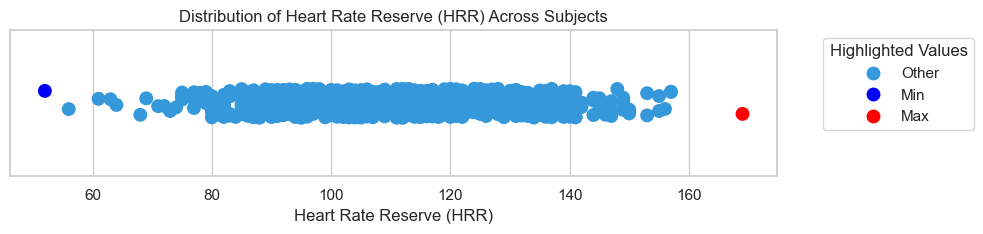

In [128]:
# Compute HR_rest and HR_max per subject
hr_stats = test.groupby("ID")["HR"].agg(HR_rest="min", HR_max="max").reset_index()
hr_stats["HRR"] = hr_stats["HR_max"] - hr_stats["HR_rest"]

# Identify min and max HRR values
min_val = hr_stats["HRR"].min()
max_val = hr_stats["HRR"].max()

# Tag each row for highlighting
hr_stats["highlight"] = hr_stats["HRR"].apply(
    lambda x: "Min" if x == min_val else ("Max" if x == max_val else "Other")
)

# Define palette based on present highlight values
palette = {"Min": "blue", "Max": "red", "Other": "#3498db"}
used_palette = {k: palette[k] for k in hr_stats["highlight"].unique()}

# Create strip plot
plt.figure(figsize=(10, 2.5))
sns.stripplot(data=hr_stats, x="HRR", hue="highlight", palette=used_palette, size=10)

plt.title("Distribution of Heart Rate Reserve (HRR) Across Subjects")
plt.xlabel("Heart Rate Reserve (HRR)")
plt.legend(title="Highlighted Values", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.show()

## 61. Create a swarm plot to visualize the relationship between humidity and temperature for each gender.

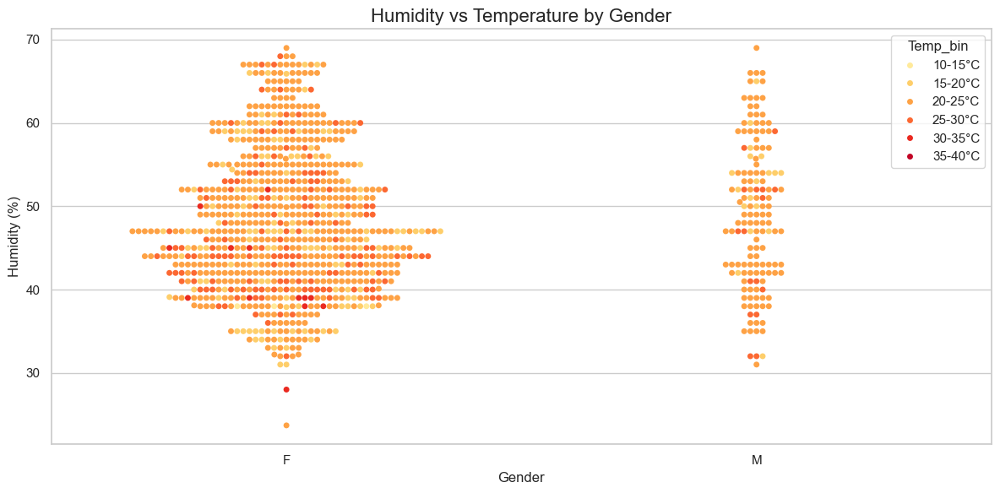

In [70]:
sub_temp=sub.copy()
sub_temp = sub_temp.dropna(subset=['Temperature', 'Humidity'])  

#using gender funct to sex column
sub_temp['Gender']=sub_temp['Sex'].apply(gender)

#Creating bins and lables
bins = [10, 15, 20, 25, 30, 35, 40]
labels = ['10-15°C', '15-20°C', '20-25°C', '25-30°C', '30-35°C', '35-40°C']

#bins for temperature
sub_temp['Temp_bin'] = pd.cut(sub_temp['Temperature'], bins=bins, labels=labels, include_lowest=True)

#swarm Plotting
plt.figure(figsize=(12,6))
sns.swarmplot(data=sub_temp, x='Gender',y='Humidity',hue='Temp_bin',palette='YlOrRd')

#Formatting
plt.title('Humidity vs Temperature by Gender', fontsize=16)
plt.xlabel('Gender')
plt.ylabel('Humidity (%)')
plt.tight_layout()
plt.show()

## 62.Analyze the relationship between fitness levels and physiological attributes and identify trends in the scatter plot of VO2 max (ml/kg/min) versus age

In [73]:
# Assuming you have a DataFrame called 'df' that contains 'Age' and 'VO2'
# First, make sure there are no missing values
df_clean = merged_tab.dropna(subset=['Age', 'VO2'])
summary = df_clean.groupby('ID').agg({
    'VO2': ['mean', 'max'],
    'Age': 'mean'
   }).reset_index()
summary.columns = ['ID', 'VO2_mean','VO2_max', 'Age']

# Create scatter plot
scatter = alt.Chart(summary).mark_point(color='orange').encode(
    x='Age',
    y='VO2_mean'
).properties(
    title='Relationship Between Age and VO₂',
    width=600,
    height=400
)

regression = scatter.transform_regression('Age', 'VO2_mean').mark_line(color='purple')

# Combine plots
chart = scatter + regression
chart

alt.LayerChart(...)

## 63.Calculate the warm-up time, GET time, cool-down time, for each athlete test and find athlete who has maximum GET time ?

In [128]:
test_clean = test.dropna(subset=['VO2', 'time'])

# Find time ranges per test
def get_phase_times(df):
    df_sorted = df.sort_values('time')

#Gets the total test time from the first to the last breath.
    total_duration = df_sorted['time'].iloc[-1] - df_sorted['time'].iloc[0]

#Find GET Point (Gas Exchange Threshold)
    df_sorted['VO2_diff'] = df_sorted['VO2'].diff()
    get_idx = df_sorted['VO2_diff'].idxmax()
#Time of GET point (end of warmup)
    warmup_end = df_sorted.loc[get_idx, 'time']
#Time ~50 breaths before the end, arbitrarily assumed to be where cooldown begins.
    cool_down_start = df_sorted['time'].iloc[-50]  # e.g., last 50 breaths = cooldown
    
    warmup_time = warmup_end - df_sorted['time'].iloc[0]
    get_time = cool_down_start - warmup_end
    cooldown_time = df_sorted['time'].iloc[-1] - cool_down_start
#This packages the calculated durations and test identifiers into a Series for later aggregation
    return pd.Series({
        'ID': df_sorted['ID'].iloc[0],
        'ID_test': df_sorted['ID_test'].iloc[0],
        'warmup_time': warmup_time,
        'GET_time': get_time,
        'cooldown_time': cooldown_time
    })

# Apply function to each test
phase_times = test_clean.groupby('ID_test').apply(get_phase_times).reset_index(drop=True)

# Find athlete with maximum GET time
max_get = phase_times.loc[phase_times['GET_time'].idxmax()]
print("Athlete with max GET time:")
print(max_get)

Athlete with max GET time:
ID                 394
ID_test          394_1
warmup_time          2
GET_time          1597
cooldown_time       75
Name: 368, dtype: object


C:\Users\space\AppData\Local\Temp\ipykernel_32212\3208293105.py:31: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



## 64. Compare the time it takes to multiply each element in a large array by 2 using an explicit loop and a vectorized operation with NumPy 

In [79]:
# Create a large array
size = 7_150_000
array = np.arange(size)

### Method 1: Using a Python loop ###
start = time.time()
result_loop = []
for i in array:
    result_loop.append(i * 2)
end = time.time()
loop_time = end - start
print(f"Loop time: {loop_time:.5f} seconds")

### Method 2: Using NumPy vectorization ###
start = time.time()
result_vectorized = array * 2
end = time.time()
vectorized_time = end - start
print(f"Vectorized time: {vectorized_time:.5f} seconds")

### Optional: Check equality ###
percentage=(abs(loop_time-vectorized_time))/(loop_time+vectorized_time)*100
print(f'Percentage diff in time: {percentage:.2f} %')

Loop time: 1.12048 seconds
Vectorized time: 0.00901 seconds
Percentage diff in time: 98.40 %


## 65. Calculate the percentage of male athletes who exceeded, the maximum treadmill speed of female athletes 

In [118]:
#65.  Calculate the percentage of male athletes who exceeded, the maximum treadmill speed of female athletes 
# Merge the two tables on ID
merged_data = pd.merge(si, tm, on='ID')

# Step 1: Get the maximum treadmill speed of female athletes
max_female_speed = merged_data[merged_data['Sex'] == 1]['Speed'].max()
#print(max_female_speed)

# Step 2: Filter male athletes who exceeded this speed
male_exceeding = merged_data[(merged_data['Sex'] == 0) & (merged_data['Speed'] > max_female_speed)]
#print(male_exceeding)

# Step 3: Calculate the percentage
total_male = merged_data[merged_data['Sex'] == 1].shape[0]
percentage = (male_exceeding.shape[0] / total_male) * 100

# Output the result
print(f"Percentage of male athletes exceeding max female speed: {percentage:.2f}%")

Percentage of male athletes exceeding max female speed: 6.13%


## 66.Visualize the number of test taken by participants and their trend of maximum Vo2 level as dual chart ?

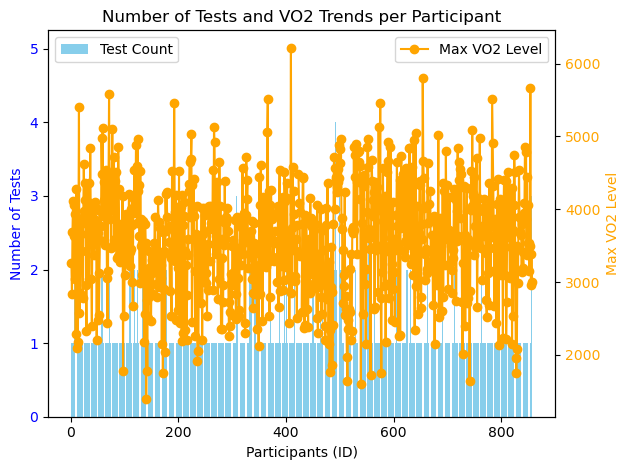

In [90]:
#66.Visualize the number of test taken by participants and their trend of maximum Vo2 level as dual chart ?
# Count the number of tests per participant
test_counts = si.groupby('ID').size().reset_index(name='Test_Count')

# Calculate the maximum VO2 level for each participant
max_vo2 = tm.groupby('ID')['VO2'].max().reset_index(name='Max_VO2')

#  Merge the data
merged_data = pd.merge(test_counts, max_vo2, on='ID')

# Visualization
fig, ax1 = plt.subplots()

# Bar chart for test counts
ax1.bar(merged_data['ID'], merged_data['Test_Count'], color='skyblue', label='Test Count')
ax1.set_xlabel('Participants (ID)')
ax1.set_ylabel('Number of Tests', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Line chart for maximum VO2 trend
ax2 = ax1.twinx()
ax2.plot(merged_data['ID'], merged_data['Max_VO2'], color='orange', marker='o', label='Max VO2 Level')
ax2.set_ylabel('Max VO2 Level', color='orange')
ax2.tick_params(axis='y', labelcolor='orange')

# Titles and legends
plt.title('Number of Tests and VO2 Trends per Participant')
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

plt.tight_layout()
plt.show()

## 67. Create violin chart for any two column from the dataset ?

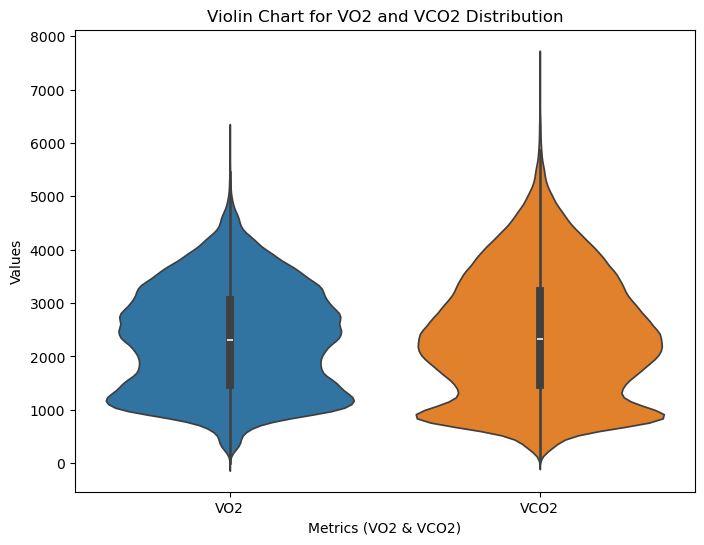

In [114]:
# 67. Create violin chart for any two column from the dataset ?

# Load the dataset
data = tm

# Create a violin chart for VO2 and VCO2 values
plt.figure(figsize=(8, 6))
sns.violinplot(data=data[['VO2', 'VCO2']])
plt.title("Violin Chart for VO2 and VCO2 Distribution")
plt.xlabel("Metrics (VO2 & VCO2)")
plt.ylabel("Values")
plt.xticks([0, 1], ['VO2', 'VCO2'])  
plt.show()

## 68. calculate BSA (Body surface area) without using function and store as column in dataframe and categorize . 

In [76]:
#68. calculate BSA (Body surface area) without using function and store as column in dataframe and categorize . 

# Map Height values for rows 1 to 10
height_map = list(map(lambda x: x, si['Height'].values[:10]))

# Map Weight values for rows 1 to 10
weight_map = list(map(lambda x: x, si['Weight'].values[:10]))

# Combine results into a DataFrame
height_weight_data = pd.DataFrame({'Height_data': height_map, 'Weight_data': weight_map})

# Calculate BSA without using a function
height_weight_data['BSA'] = (height_weight_data['Weight_data'] * height_weight_data['Height_data']/ 3600) ** 0.5  # Applying the formula

# Categorize BSA using conditions without defining a function
height_weight_data['BSA_Category'] = 'Medium'  # Default value
height_weight_data.loc[height_weight_data['BSA'] < 1.5, 'BSA_Category'] = 'Small'
height_weight_data.loc[height_weight_data['BSA'] > 2.0, 'BSA_Category'] = 'Large'

# Display the updated DataFrame
print(height_weight_data.to_string(index=False))

 Height_data  Weight_data      BSA BSA_Category
       173.5         67.0 1.796950       Medium
       171.1         68.0 1.797746       Medium
       176.0         63.8 1.766101       Medium
       181.3         88.0 2.105179        Large
       181.4         85.0 2.069554        Large
       172.8         65.0 1.766352       Medium
       171.7         70.0 1.827187       Medium
       173.8         73.5 1.883724       Medium
       182.0         86.0 2.085133        Large
       167.0         72.0 1.827567       Medium


## 69.Write a python function that efficiently processes large data into chunks to analyze average heart rate and maximum oxygen consumption for each test. Print the chunks during processing.

In [74]:
#69.Write a python function that efficiently processes large data into chunks to analyze average heart rate and
# maximum oxygen consumption for each test. Print the chunks during processing.


def process_data_in_chunks(file_path, chunk_size):
    """
    Processes large data in chunks to calculate the average heart rate
    and maximum oxygen consumption (VO2) for each test.
    
    Args:
        file_path (str): Path to the CSV file containing the data.
        chunk_size (int): Number of rows per chunk.
        
    Returns:
        pd.DataFrame: A summary DataFrame with average HR and max VO2 for each test.
    """
    results = []

    # Process the file in chunks
    for chunk in pd.read_csv(file_path, chunksize=chunk_size):
        # Print the current chunk being processed
        print("Processing Chunk:")
        print(chunk)

        # Perform calculations within each chunk
        summary = chunk.groupby('ID_test').agg(
            Average_HR=('HR', 'mean'),  # Average heart rate
            Max_VO2=('VO2', 'max')     # Maximum oxygen consumption
        ).reset_index()

        # Append results to the list
        results.append(summary)

    # Combine all chunk summaries into a single DataFrame
    final_results = pd.concat(results, ignore_index=True)

    # Return the combined summary
    return final_results

file_path = 'test_measure.csv'

# Define chunk size
chunk_size = 1000  

# Call the function
summary_results = process_data_in_chunks(file_path, chunk_size)

# Display the final summarized results
print("\nFinal Summarized Results:")
print(summary_results)

Processing Chunk:
     time  Speed     HR   VO2  VCO2  RR    VE ID_test  ID
0       0    5.0   63.0   478   360  27  13.3     2_1   2
1       2    5.0   75.0   401   295  23  10.3     2_1   2
2       4    5.0   82.0   449   319  29  12.2     2_1   2
3       7    5.0   87.0   461   340  28  12.8     2_1   2
4       9    5.0   92.0   574   417  28  14.6     2_1   2
..    ...    ...    ...   ...   ...  ..   ...     ...  ..
995   687   16.5  196.0  3344  3552  35  83.2     3_1   3
996   688   16.5  196.0  3419  3645  39  87.4     3_1   3
997   689   16.5  197.0  3364  3595  39  87.5     3_1   3
998   690   16.5  197.0  3500  3729  40  90.9     3_1   3
999   692   16.5  197.0  3569  3849  42  96.9     3_1   3

[1000 rows x 9 columns]
Processing Chunk:
      time  Speed     HR   VO2  VCO2  RR     VE ID_test  ID
1000   693   16.6  197.0  3558  3850  45   98.8     3_1   3
1001   694   16.6  197.0  3404  3697  44   94.7     3_1   3
1002   695   16.6  197.0  3524  3852  47   99.7     3_1   3
100

## 70. "How does the body's production of carbon dioxide related to the consumption of oxygen with increasing levels of pulmonary ventilation during GET? Use low, medium, and high bins values for VE to find your observations."

In [70]:
#70. "How does the body's production of carbon dioxide related to the consumption 
# of oxygen with increasing levels of pulmonary ventilation during GET? 
# Use low, medium, and high bins values for VE to find your observations."

# Dynamically bin VE into Low, Medium, and High
tm['VE_Bin'] = pd.cut(tm['VE'], bins=3, labels=['Low', 'Medium', 'High'])

# Group by VE_Bin and calculate average VO2 and VCO2 for each bin
grouped_data = tm.groupby('VE_Bin',observed=False).agg(
    Average_VO2=('VO2', 'mean'),
    Average_VCO2=('VCO2', 'mean')
).reset_index()

# Display grouped observations
print("Grouped Data by VE Bins:")
print(grouped_data.to_string(index=False))

Grouped Data by VE Bins:
VE_Bin  Average_VO2  Average_VCO2
   Low  1655.178750   1548.638533
Medium  3042.400724   3310.514378
  High  4031.003822   4744.958867


## 71. Create a Funnel chart of Age Category (Child, Teen, Adult and Senior) ?

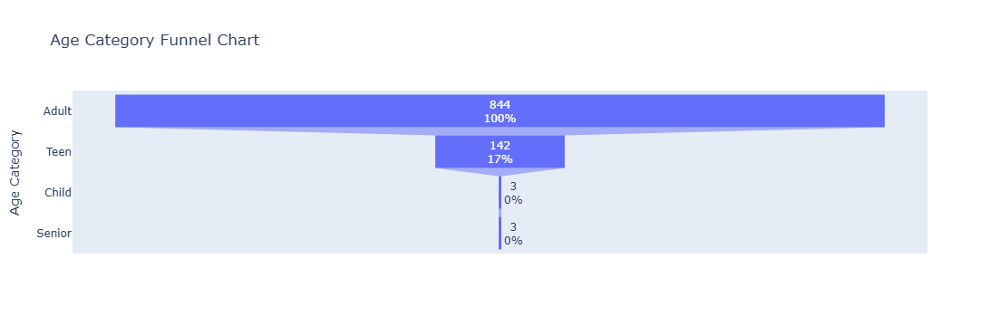

In [68]:
#71. Create a Funnel chart of Age Category (Child, Teen, Adult and Senior) ?
import plotly.graph_objects as go

# Define age categories and dynamically assign labels
def categorize_age(age):
    if age < 13:
        return 'Child'
    elif 13 <= age < 18:
        return 'Teen'
    elif 18 <= age < 60:
        return 'Adult'
    else:
        return 'Senior'

si['Age_Category'] = si['Age'].apply(categorize_age)

# Count individuals in each age category
age_counts = si['Age_Category'].value_counts()
categories = age_counts.index.tolist()
counts = age_counts.values.tolist()

# Create the funnel chart
fig = go.Figure(go.Funnel(
    y=categories,
    x=counts,
    textinfo="value+percent initial"  # Display value and percentage of total
))

# Customize layout
fig.update_layout(
    title="Age Category Funnel Chart",
    xaxis_title="Count",
    yaxis_title="Age Category",
)

# Display the chart
fig.show()

## 72. visualize different physiological parameters over time for a specific test of an athlete using multiple panels?

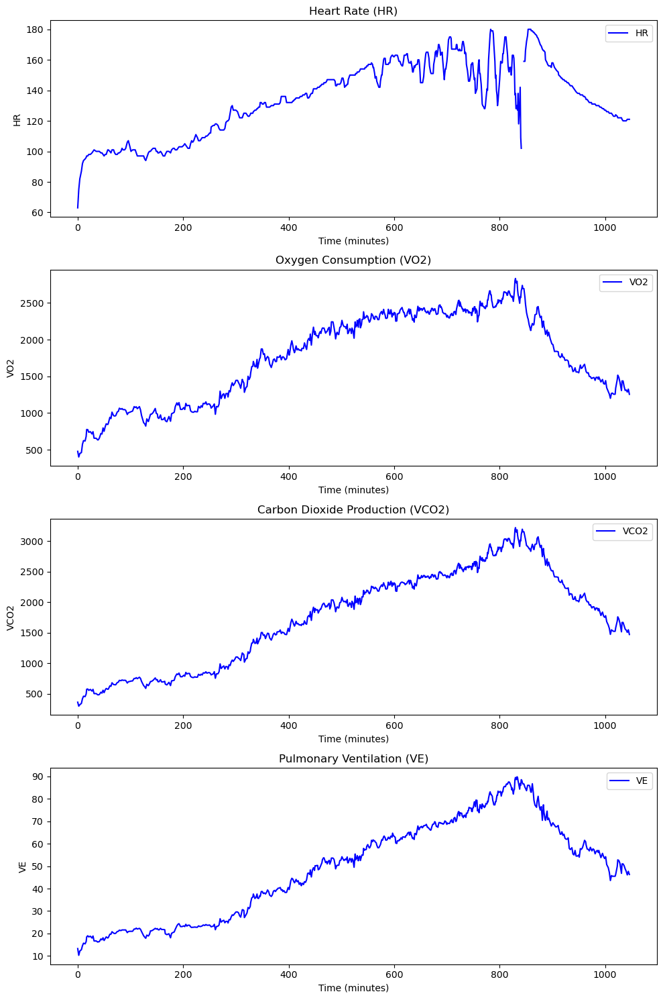

In [58]:
#72. visualize different physiological parameters over time for a specific test of an athlete using multiple panels?

# Filter data for the specific test (e.g., Test ID: '2_1')
specific_test_id = '2_1'
test_data = tm[tm['ID_test'] == specific_test_id]

# Create multi-panel plots
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(10, 15))
parameters = ['HR', 'VO2', 'VCO2', 'VE']
titles = ['Heart Rate (HR)', 'Oxygen Consumption (VO2)', 'Carbon Dioxide Production (VCO2)', 'Pulmonary Ventilation (VE)']

for i, param in enumerate(parameters):
    axes[i].plot(test_data['time'], test_data[param], label=param, color='blue')
    axes[i].set_title(titles[i])
    axes[i].set_ylabel(param)
    axes[i].set_xlabel('Time (minutes)')
    
    axes[i].legend()

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

## 73.Print first 10 records of the subject_info based on ID, without using head() method.

In [54]:
#73.Print first 10 records of the subject_info based on ID, without using head() method.

# Sort the DataFrame by ID (if required)
si = si.sort_values(by="ID")

# Print the first 10 records using slicing
print(si.iloc[:10].to_string(index=False))  # iloc allows slicing by numerical indices

 Age  Weight  Height  Humidity  Temperature  Sex  ID ID_test
32.7    67.0   173.5       NaN          NaN    0   1     1_1
33.8    68.0   171.1       NaN          NaN    0   2     2_1
16.6    63.8   176.0      43.0         24.6    0   3     3_1
28.5    88.0   181.3       NaN          NaN    0   4     4_1
23.4    85.0   181.4       NaN          NaN    0   5     5_1
27.9    65.0   172.8       NaN          NaN    0   6     6_1
27.3    70.0   171.7       NaN          NaN    0   7     7_1
32.2    73.5   173.8       NaN          NaN    0   7   7_149
31.5    86.0   182.0       NaN          NaN    0   8     8_1
24.5    72.0   167.0      69.0         22.0    1   9     9_1


## 74. Determine the treadmill speed range and age range in which you observe the highest average heart rate.

In [50]:
#74. Determine the treadmill speed range and age range in which you observe the highest average heart rate.

# Merge the datasets based on subject and test IDs (update join keys as needed)
merged_data = tm.merge(si, left_on='ID_test', right_on='ID_test')

# Group by Speed and Age, and calculate average HR
grouped_data = merged_data.groupby(['Speed', 'Age']).agg(Average_HR=('HR', 'mean')).reset_index()

# Find the combination with the highest average HR
highest_hr = grouped_data.loc[grouped_data['Average_HR'].idxmax()]

# Extract ranges
speed_range = highest_hr['Speed']
age_range = highest_hr['Age']
highest_avg_hr = highest_hr['Average_HR']

print("Treadmill Speed Range:", speed_range)
print("Age Range:", age_range)
print(f"Highest Average HR: {highest_avg_hr:.2f}")

Treadmill Speed Range: 16.7
Age Range: 17.9
Highest Average HR: 212.37


## 75.Identify subjects whose heart rate (HR) is consistently above their age group’s 75th percentile.

In [48]:
#75.Identify subjects whose heart rate (HR) is consistently above their age group’s 75th percentile.

# Merge datasets on the common column 'ID_test'
merged_data = tm.merge(si, on='ID')

# Group data by Age and calculate the 75th percentile HR for each age group
percentiles = merged_data.groupby('Age')['HR'].quantile(0.75).reset_index()
percentiles.rename(columns={'HR': 'HR_75th_Percentile'}, inplace=True)

# Merge the 75th percentile HR data back to the merged dataset
merged_data = merged_data.merge(percentiles, on='Age')

# Filter rows where HR is consistently above the 75th percentile for their age group
filtered_data = merged_data[merged_data['HR'] > merged_data['HR_75th_Percentile']]

# Group by unique subject IDs ('ID') and summarize results
grouped_by_id = filtered_data.groupby('ID').agg(
    Max_HR=('HR', 'max'),              # Maximum HR above 75th percentile
    Age_Group=('Age', 'unique')        # Unique age group(s)
).reset_index()

# Output the final grouped data
print("Subjects whose HR is consistently above their age group’s 75th percentile:")
print(grouped_by_id.to_string(index=False))

Subjects whose HR is consistently above their age group’s 75th percentile:
 ID  Max_HR                      Age_Group
  1   180.0                         [32.7]
  2   180.0                         [33.8]
  3   205.0                         [16.6]
  4   192.0                         [28.5]
  5   197.0                         [23.4]
  6   187.0                         [27.9]
  7   194.0                   [27.3, 32.2]
  8   186.0                         [31.5]
  9   187.0                         [24.5]
 10   197.0                         [29.3]
 11   193.0                         [11.8]
 12   184.0                         [27.1]
 13   174.0                         [34.8]
 14   183.0                         [16.4]
 15   188.0             [25.7, 25.4, 24.8]
 16   205.0                         [17.3]
 17   206.0                         [17.3]
 18   176.0                         [37.6]
 19   188.0                   [26.3, 27.6]
 20   185.0                         [28.6]
 21   194.0           

## 76. list the participants ID and test _ID who started their warm up with speed less than 5km/h ?

In [44]:
# 76. list the participants ID and test _ID who started their warm up with speed less than 5km/h ?

# Filter participants with warm-up speed < 5 km/h
filtered_data = tm[tm['Speed'] < 5][['ID', 'ID_test']]

# Display the result
print(filtered_data.to_string(index=False))

 ID ID_test
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  4     4_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1     1_1
  1 

## 77. Calculate the mean VO2 max for male and female athletes in the Get Phase.

In [42]:
#77. Calculate the mean VO2 max for male and female athletes in the Get Phase.

# Merge the data to include sex and other demographic details
merged_data = pd.merge(tm, si, left_on='ID_test', right_on='ID_test')

# Identify GET phase based on VCO2 and VO2 relationship
merged_data['GET_Phase'] = merged_data['VCO2'] / merged_data['VO2'] > 1  # Example condition: VCO2 > VO2

# Filter data for GET phase
get_phase_data = merged_data[merged_data['GET_Phase']]

# Group by sex and calculate mean VO2 max
vo2_max_means = get_phase_data.groupby('Sex')['VO2'].mean().round(2)

# Display the results for Male and Female explicitly
print("Mean VO2 max during GET phase:")
print(f"Female Athletes: {vo2_max_means.get('Female', vo2_max_means[1])}")
print(f"Male Athletes: {vo2_max_means.get('Male', vo2_max_means[0])}")


Mean VO2 max during GET phase:
Female Athletes: 1899.79
Male Athletes: 2726.43


## 78. If you consider cool down time as the recovery period after reaching peak speed, display the participant details who has taken the longest Cool Down time.

In [40]:
#78. If you consider cool down time as the recovery period after reaching peak speed, 
# display the participant details who has taken the longest Cool Down time.

# Step 1: Calculate the peak speed (max speed) for each participant
# Assuming 'speed' column contains speed data
peak_speed_data = tm.groupby('ID_test')['Speed'].max().reset_index()
peak_speed_data.rename(columns={'Speed': 'peak_speed'}, inplace=True)

# Step 2: Find the participant with the longest cool down time after reaching peak speed
# Merge peak speed data back with the test_measure data
merged_test_data = pd.merge(tm, peak_speed_data, on='ID_test')

# Filter for participants who reached peak speed
participants_with_peak_speed = merged_test_data[merged_test_data['Speed'] == merged_test_data['peak_speed']]

# Identify the participant with the longest cool down time
longest_cool_down = participants_with_peak_speed.loc[participants_with_peak_speed['time'].idxmax()]

# Step 3: Get complete participant details from subject-info
participant_details = si[si['ID_test'] == longest_cool_down['ID_test']]

# Display the results
print("Participant details who reached peak speed and took the longest Cool Down time:")
print(participant_details.to_string(index=False))


Participant details who reached peak speed and took the longest Cool Down time:
 Age  Weight  Height  Humidity  Temperature  Sex  ID ID_test
39.7    75.5   180.0      45.0         17.0    0 699   699_1


## 79. Identify the athlete who recorded the highest treadmill speed during the tests.

In [36]:
#79. Identify the athlete who recorded the highest treadmill speed during the tests.

# Step 1: Find the maximum treadmill speed and the corresponding participant
max_speed_row = tm.loc[tm['Speed'].idxmax()]

# Step 2: Retrieve participant details using the ID_test
participant_details = si[si['ID_test'] == max_speed_row['ID_test']]

# Display the results
print("Participant details who recorded the highest treadmill speed:")
print(participant_details.to_string(index=False))

Participant details who recorded the highest treadmill speed:
 Age  Weight  Height  Humidity  Temperature  Sex  ID ID_test
18.0    63.0   171.0      62.0         22.2    0 431   431_1


## 80. Show the oxygen consumption trend analysis among women athletes across different age groups

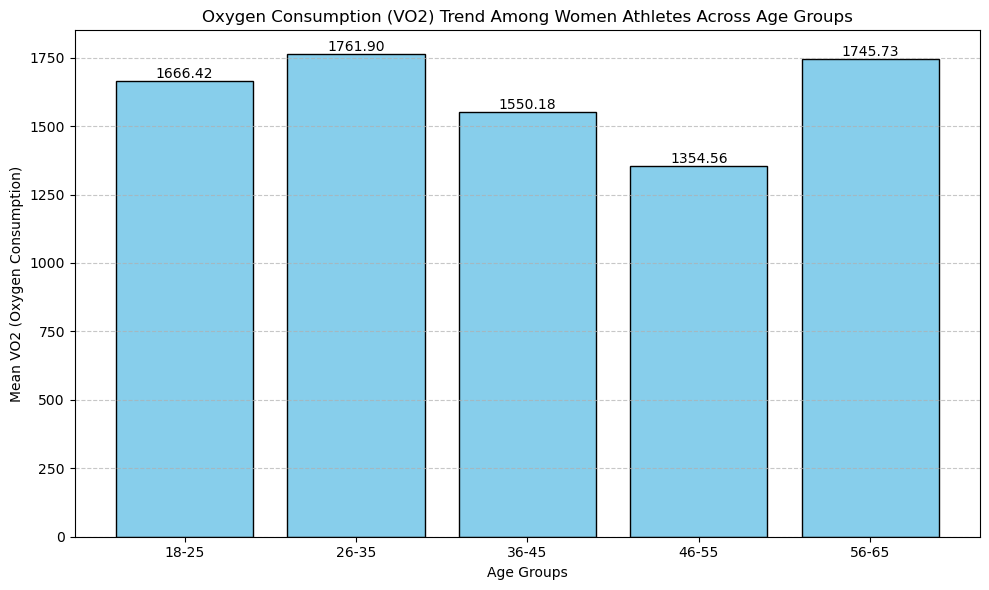

In [30]:
#80. Show the oxygen consumption trend analysis among women athletes across different age groups

# Merge the datasets based on 'ID_test'
merged_data = pd.merge(tm, si, on='ID_test')

# Filter for women athletes (Sex == 'Female') and make a copy to avoid the warning
women_data = merged_data[merged_data['Sex'] == 1].copy()

# Categorize age groups (e.g., 18-25, 26-35, etc.)
bins = [18, 25, 35, 45, 55, 65]  # Define age bins
labels = ['18-25', '26-35', '36-45', '46-55', '56-65']  # Age group labels
women_data['Age_Group'] = pd.cut(women_data['Age'], bins=bins, labels=labels)

# Calculate mean VO2 for each age group
vo2_trends = women_data.groupby('Age_Group', observed=False)['VO2'].mean()

# Plot the trend analysis
plt.figure(figsize=(10, 6))
bars = plt.bar(vo2_trends.index, vo2_trends.values, color='skyblue', edgecolor='black')
plt.title('Oxygen Consumption (VO2) Trend Among Women Athletes Across Age Groups')
plt.xlabel('Age Groups')
plt.ylabel('Mean VO2 (Oxygen Consumption)')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add data labels on top of each bar
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{height:.2f}', ha='center', va='bottom', fontsize=10)

plt.tight_layout()

# Display the plot
plt.show()